In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
def get_MSE(y_pred, y_true):
    return np.mean((y_pred - y_true)**2)

In [131]:
from sklearn.model_selection import train_test_split

train_df = pd.read_csv("midterm1_train.csv")
train_df = train_df.drop(['url', 'timedelta'], axis=1)
train_x_all = train_df.drop(['shares'], axis=1)
train_y_all = train_df['shares']

x_train, x_test, y_train, y_test = train_test_split(train_x_all, train_y_all, test_size=0.2, random_state=77)

Text(0.5, 0.98, 'Non-Normalized vs. Normalized Outcome Variable Distribution')

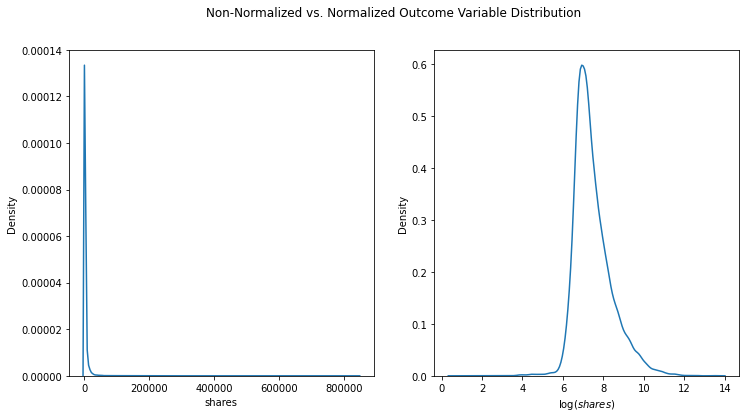

In [132]:
fig, axs = plt.subplots(1,2,figsize=(12,6))
sns.kdeplot(y_train, ax=axs[0])
sns.kdeplot(np.log(1 + y_train), ax=axs[1])
axs[0].set_xlabel('shares')
axs[1].set_xlabel('$\log(shares)$')
fig.suptitle('Non-Normalized vs. Normalized Outcome Variable Distribution')

# Full model with all covariates

## KNN

In [7]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split

train_df = pd.read_csv("midterm1_train.csv")
train_df = train_df.drop(['url', 'timedelta'], axis=1)

train_x_all = train_df.drop(['shares'], axis=1)
train_y_all = train_df['shares']

# manually hold out 20% of data for testing
x_train, x_test, y_train, y_test = train_test_split(train_x_all, train_y_all, test_size=0.2, random_state=77)

# transform y_test and y_train due to overly skewed distribution
y_train = np.log(y_train)
y_test = np.log(y_test)


In [139]:
# Standardize X b/c KNN depends on distance metrics
from sklearn.preprocessing import StandardScaler

# Standardize X
scaler = StandardScaler()
x_train = scaler.fit_transform(x_train)
x_test = scaler.transform(x_test)

KNN_reg = KNeighborsRegressor(n_neighbors=5)
KNN_reg.fit(X=x_train, y=y_train)

print('KNN MSE w/ K=5:', get_MSE(KNN_reg.predict(x_test), y_test))

KNN MSE w/ K=5: 0.8871915471296086


#### K-fold Validation to find the optimal K

In [ ]:
k_param = [_ for _ in range(1, 1002, 20)]
knn_cv_result_coarse = []

for k in k_param:
    KNN_reg = KNeighborsRegressor(n_neighbors=k)
    score = cross_val_score(estimator=KNN_reg, X=x_train, y=y_train, cv=5, verbose=0, n_jobs=9, scoring='neg_mean_squared_error')
    knn_cv_result_coarse.append({'k': k, 'mse': np.mean(score)})


In [ ]:
k_param = [_ for _ in range(1, 201, 1)]
knn_cv_result = []

for k in k_param:
    KNN_reg = KNeighborsRegressor(n_neighbors=k)
    score = cross_val_score(estimator=KNN_reg, X=x_train, y=y_train, cv=5, verbose=0, n_jobs=9, scoring='neg_mean_squared_error')
    knn_cv_result.append({'k': k, 'mse': np.mean(score)})


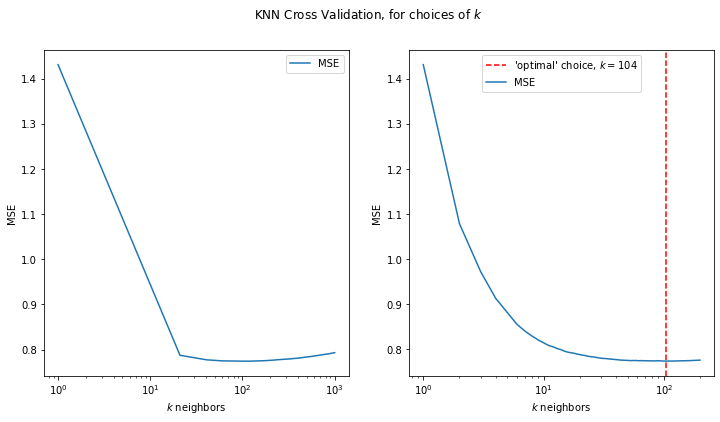

In [87]:
fig, axs = plt.subplots(1, 2, figsize=(12,6))
temp=0
for ax in axs:
    if temp == 0:
        knn_cv_df = pd.DataFrame(knn_cv_result_coarse)
        temp=1
    else:
        knn_cv_df = pd.DataFrame(knn_cv_result)
        ax.axvline(x=knn_cv_df.sort_values('mse', ascending=False).iloc[0,0], c='r', ls= '--', label=f"'optimal' choice, $k={knn_cv_df.sort_values('mse', ascending=False).iloc[0,0]}$")
    knn_cv_df['mse'] = -knn_cv_df['mse']
    
    ax.plot(knn_cv_df['k'], knn_cv_df['mse'], label='MSE')
    ax.set_xscale('log')
    ax.set_xlabel('$k$ neighbors')
    ax.set_ylabel('MSE')
    fig.suptitle('KNN Cross Validation, for choices of $k$')
    ax.legend()

## LR with Shrinkage Regularization

### Ridge Regression

#### Usual Data Prep

In [88]:
train_df = pd.read_csv("midterm1_train.csv")
train_df = train_df.drop(['url', 'timedelta'], axis=1)

train_x_all = train_df.drop(['shares'], axis=1)
train_y_all = train_df['shares']

# manually hold out 20% of data for testing
x_train, x_test, y_train, y_test = train_test_split(train_x_all, train_y_all, test_size=0.2, random_state=77)

# transform y_test and y_train due to overly skewed distribution
y_train = np.log(y_train)
y_test = np.log(y_test)


In [37]:
from sklearn.preprocessing import StandardScaler

# Standardize X b/c penalization on the sum of coefs
scaler = StandardScaler()
x_train = scaler.fit_transform(x_train)
x_test = scaler.transform(x_test)

#### K-fold Validation to find the optimal regularization parameter $\lambda$

Text(0.5, 0.98, 'MSE Path w.r.t regularization parameter $\\lambda$')

/Users/fanjiaxz/Library/Mobile Documents/com~apple~CloudDocs/Emory/Spring 2022/Statistical Learning/venv/lib/python3.10/site-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


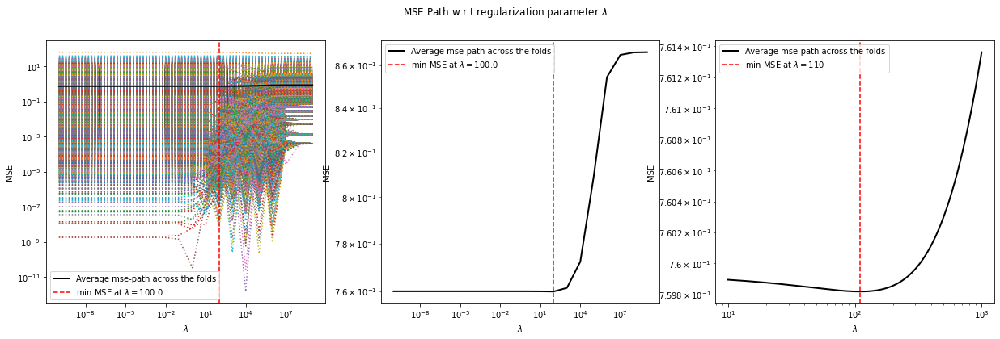

In [155]:
from sklearn import linear_model

# LOOCV
ridge_reg_cv = linear_model.RidgeCV(cv=None, alphas=[10**i for i in range(-10, 10)],store_cv_values=True)
ridge_reg_cv.fit(X=x_train, y=y_train)

# based on last cv, do a more granular search
ridge_reg_cv_fine = linear_model.RidgeCV(cv=None, alphas=[i for i in range(10, 1001, 1)], store_cv_values=True)
ridge_reg_cv_fine.fit(X=x_train, y=y_train)


# plot lambda vs. MSE
fig, axs = plt.subplots(1, 3, figsize=(21,6))
for i in range(0,3):
    if i == 0:
        axs[i].plot([10**i for i in range(-10, 10)], ridge_reg_cv.cv_values_.T, linestyle=":")
    elif i == 2: # plot only on the third figure
        x = [i for i in range(10, 1001, 1)]
        reg_cv = ridge_reg_cv_fine
    if i != 2: # plot on first and second figure
        x = [10**i for i in range(-10, 10)]
        reg_cv = ridge_reg_cv
    

    axs[i].plot(
        x,
        np.mean(reg_cv.cv_values_, axis=0),
        color="black",
        label="Average mse-path across the folds",
        linewidth=2
    )

    axs[i].axvline(reg_cv.alpha_, linestyle="--", color="r", label=f"min MSE at $\lambda={reg_cv.alpha_}$")
    axs[i].set_xscale('log')
    axs[i].set_yscale('log')
    axs[i].set_xlabel(r"$\lambda$")
    axs[i].set_ylabel("MSE")
    axs[i].legend()

fig.suptitle('MSE Path w.r.t regularization parameter $\lambda$')



Based on the cross validation result above, we choose $\lambda=110$ and fit our full model using the entire training set

In [148]:
ridge_reg = linear_model.Ridge(alpha=110)
ridge_reg.fit(X=x_train, y=y_train)

Ridge(alpha=110)

### Lasso Regression

#### Usual Data Prep

In [243]:
train_df = pd.read_csv("midterm1_train.csv")
train_df = train_df.drop(['url', 'timedelta'], axis=1)

train_x_all = train_df.drop(['shares'], axis=1)
train_y_all = train_df['shares']

# manually hold out 20% of data for testing
x_train, x_test, y_train, y_test = train_test_split(train_x_all, train_y_all, test_size=0.2, random_state=77)

# transform y_test and y_train due to overly skewed distribution
y_train = np.log(y_train)
y_test = np.log(y_test)


In [244]:
from sklearn.preprocessing import StandardScaler

# Standardize X b/c penalization on the sum of coefs
scaler = StandardScaler()
x_train = scaler.fit_transform(x_train)
x_test = scaler.transform(x_test)

#### K-fold Validation to find the optimal regularization parameter $\lambda$

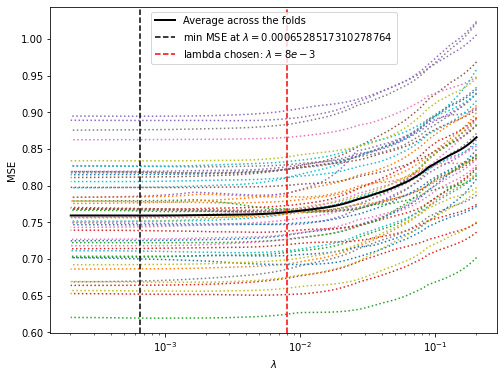

In [245]:
from sklearn import linear_model
lasso_reg_cv = linear_model.LassoCV(cv=50, max_iter=10000, n_alphas=1000)
lasso_reg_cv.fit(x_train, y_train)

fig, ax = plt.subplots(figsize=(8,6))
ax.plot(lasso_reg_cv.alphas_, lasso_reg_cv.mse_path_, linestyle=":")
ax.plot(
    lasso_reg_cv.alphas_,
    lasso_reg_cv.mse_path_.mean(axis=-1),
    color="black",
    label="Average across the folds",
    linewidth=2,
)
ax.axvline(lasso_reg_cv.alpha_, linestyle="--", color="k", label=f"min MSE at $\lambda={lasso_reg_cv.alpha_}$")
ax.axvline(8e-3, linestyle="--", color="r", label="lambda chosen: $\lambda = 8e-3$")
ax.set_xscale('log')
ax.set_xlabel(r"$\lambda$")
ax.set_ylabel("MSE")
ax.legend()

The coefficients if the $\lambda$ that minimizes the expected MSE were used:

In [17]:
print(f"The number of coefficients penalized to 0: {np.sum([1 for i in lasso_reg_cv.coef_ if abs(i) < 1e-32])}")
lasso_reg_cv.coef_

The number of coefficients penalized to 0: 8


array([ 1.69078050e-02,  1.22121023e-02,  0.00000000e+00,  3.25847915e-02,
       -2.36492890e-02,  5.38812473e-02, -2.74870739e-02,  2.12648166e-02,
        8.89751056e-03, -7.32090238e-02,  2.31615599e-02, -1.64810027e-02,
       -7.67882299e-02, -5.45944678e-02,  4.13283423e-02,  4.47773486e-02,
       -1.06316243e-02,  5.79408011e-02,  4.42467953e-02, -6.09839263e-02,
       -2.38665653e-02, -0.00000000e+00, -4.25819956e-02, -5.44536213e-02,
       -2.33446325e-01,  4.16072548e-01,  1.27404726e-02,  2.59240436e-04,
        3.61458345e-02,  1.31465870e-02, -2.73446559e-04, -0.00000000e+00,
       -3.69272562e-03,  1.78598752e-02,  0.00000000e+00,  4.86926928e-03,
        9.14142913e-02,  7.68045792e-02, -4.63374341e-03, -4.30620382e-02,
       -0.00000000e+00,  2.17970282e-02,  4.86715838e-02, -1.18263514e-02,
       -1.51867944e-02,  0.00000000e+00,  2.37188855e-02, -0.00000000e+00,
       -0.00000000e+00, -1.55486235e-02, -7.54922081e-04, -8.90632170e-03,
       -3.72979284e-03,  

The coefficients if $\lambda=8\times10^{-3}$ were used:

In [18]:
lasso_reg = linear_model.Lasso(alpha=8e-3)
lasso_reg = lasso_reg.fit(X=x_train, y=y_train)
print(f"The number of coefficients penalized to 0: {np.sum([1 for i in lasso_reg.coef_ if abs(i) < 1e-32])}")
lasso_reg.coef_

The number of coefficients penalized to 0: 21


array([ 0.0044589 ,  0.00713503, -0.00439715, -0.        , -0.01983852,
        0.04840953, -0.01171899,  0.01656645,  0.        , -0.02320548,
        0.02935165, -0.        , -0.07004091, -0.02197416,  0.05007428,
        0.04556908, -0.        ,  0.04991113, -0.        , -0.01208959,
       -0.0243291 , -0.        , -0.00767512, -0.01114648, -0.13429278,
        0.28667558,  0.00944967,  0.        ,  0.03278384,  0.00113367,
       -0.        , -0.        , -0.00289757,  0.00742757,  0.        ,
        0.        ,  0.08458185,  0.02262226, -0.00786435, -0.07195588,
        0.        ,  0.        ,  0.03887786, -0.        , -0.        ,
       -0.        ,  0.        , -0.        , -0.        , -0.00807052,
        0.        , -0.00422877, -0.00226502, -0.        ,  0.00388317,
        0.01000933,  0.00573907,  0.00543547])

THerefore, we choose the lambda denoted as the red line in our plot above because it achieves a similar expected out of the sample estimation of MSE yet penalizing more regression coefficients to 0 (8 vs. 21). This gives us a much more simpler model that could potentially be less prone to overfitting.

## GAMs

In [15]:
train_df = pd.read_csv("midterm1_train.csv")
train_df = train_df.drop(['url', 'timedelta'], axis=1)
train_df = train_df.astype(float)
train_x_all = train_df.drop(['shares'], axis=1)
train_y_all = train_df['shares']

# manually hold out 20% of data for testing
x_train, x_test, y_train, y_test = train_test_split(train_x_all, train_y_all, test_size=0.2, random_state=77)

# transform y_test and y_train due to overly skewed distribution
y_train = np.log(y_train)
y_test = np.log(y_test)


In [16]:
from sklearn.preprocessing import StandardScaler

# Standardize X b/c pyGAM would not work otherwise: https://github.com/dswah/pyGAM/issues/301
# "ValueError: X data is out of domain for categorical feature 10. Expected data on [1.0, 10.0], but found data on [0.0, 0.0]"
# np.unique(x_train[:,10])
scaler = StandardScaler()
x_train = scaler.fit_transform(x_train)
x_test = scaler.transform(x_test)

<AxesSubplot:>

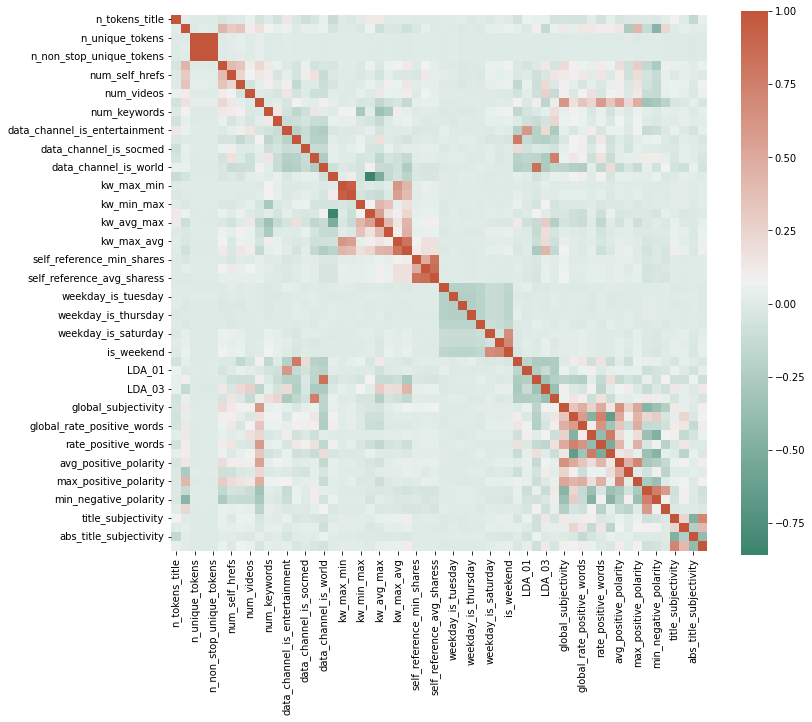

In [130]:
# Correlation among Covariates
fig, ax = plt.subplots(figsize=(12,10))
sns.heatmap(train_x_all.corr(), square=True, ax=ax, cmap=sns.diverging_palette(160, 20, as_cmap=True))

In [17]:
from pygam import GAM, s, f, te

def getGamTerms():
    for i in range(0, len(train_x_all.columns)):
        if i == 0: # initialize the first gam term
            gam_terms = s(0)
            continue
        # check if categorical
        if len(train_x_all.iloc[:,i].unique()) <= 10: #fewer than 10 levels
            gam_terms += f(i) # use factor term
        else:
            gam_terms += s(i)
    return gam_terms

gam_reg = GAM(getGamTerms()).fit(X=x_train, y=y_train)


GAM                                                                                                       
=============================================== ==========================================================
Distribution:                        NormalDist Effective DoF:                                    513.9286
Link Function:                     IdentityLink Log Likelihood:                                -35636.5893
Number of Samples:                        28000 AIC:                                            72303.0357
                                                AICc:                                           72322.3681
                                                GCV:                                                 0.746
                                                Scale:                                              0.7214
                                                Pseudo R-Squared:                                   0.1824
Feature Function                  Lam

/var/folders/vw/fhlnd7k958g99z5bj0yg57vh0000gn/T/ipykernel_65923/907877748.py:1: UserWarning: KNOWN BUG: p-values computed in this summary are likely much smaller than they should be. 
 
Please do not make inferences based on these values! 

Collaborate on a solution, and stay up to date at: 
github.com/dswah/pyGAM/issues/163 

  print(gam_reg.summary())


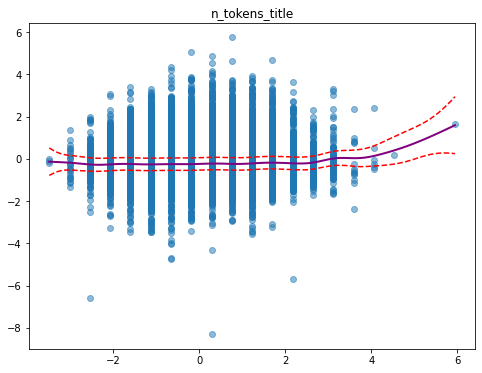

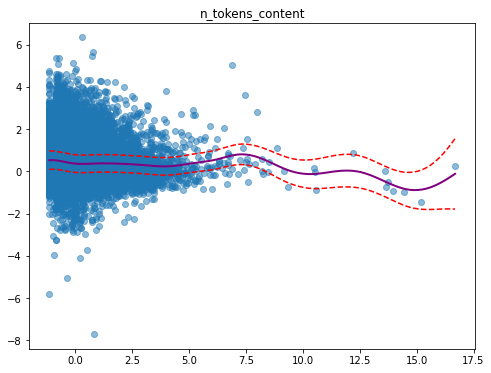

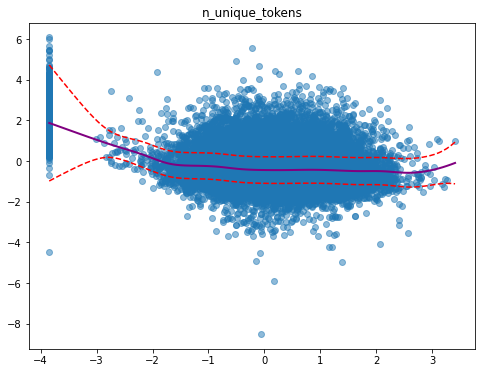

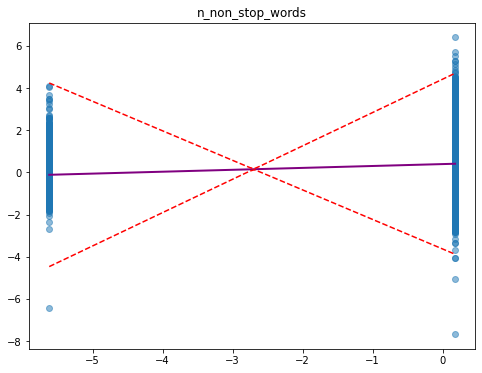

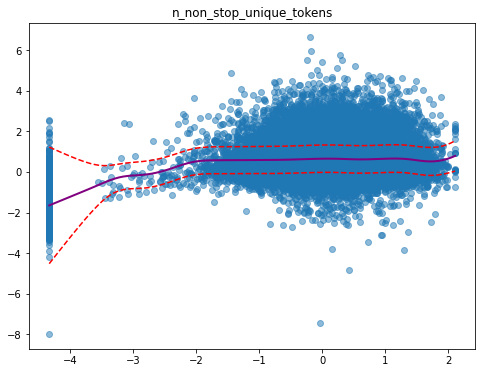

...

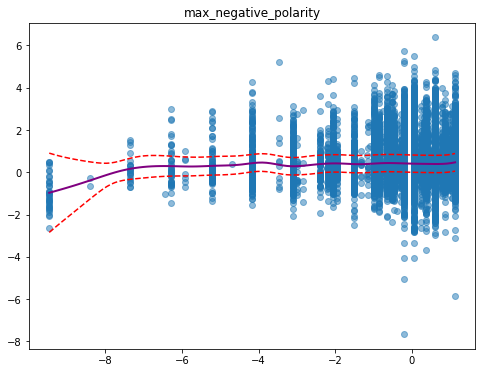

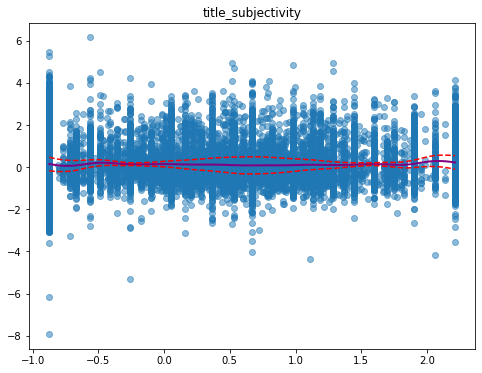

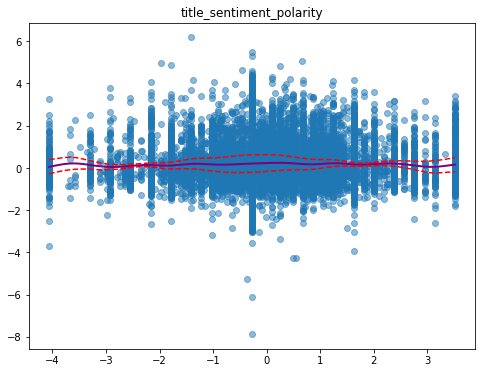

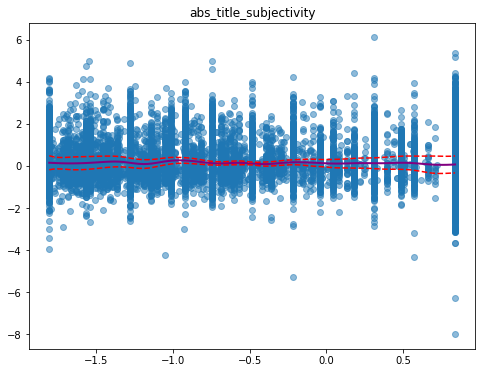

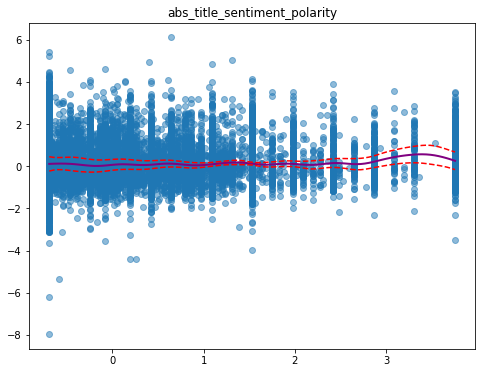

In [132]:
print(gam_reg.summary())
res = gam_reg.deviance_residuals(x_train, y_train)
for i, term in enumerate(gam_reg.terms):
    if term.isintercept: continue
    if term.istensor:
        XX = gam_reg.generate_X_grid(term=i, meshgrid=True)
        Z = gam_reg.partial_dependence(term=i, X=XX, meshgrid=True)
        # plot contour and 3d surface
        fig = plt.figure(figsize=(12,10))
        ax = fig.add_subplot(2, 2, 1)
        cs = ax.contour(XX[0], XX[1], Z, levels=np.linspace(Z.min(), Z.max(), 20))
        ax.clabel(cs, inline=1, fontsize=10)
        # colorbar
        fig.colorbar(cs, ax=ax)
        ax.set_xlabel(train_x_all.columns.values[term.feature[0]])
        ax.set_ylabel(train_x_all.columns.values[term.feature[1]])

        # 3d surface
        ax = fig.add_subplot(2, 2, 2, projection='3d')
        surf = ax.plot_surface(XX[0], XX[1], Z, rstride=1, cstride=1, cmap='viridis', linewidth=0, antialiased=False)
        # add colorbar
        fig.colorbar(surf, shrink=0.5, aspect=5)
        ax.set_xlabel(train_x_all.columns.values[term.feature[0]])
        ax.set_ylabel(train_x_all.columns.values[term.feature[1]])
        

        print(term.feature)
        #plt.title(train_x_chosen.columns.values[term.feature])
        continue
    XX = gam_reg.generate_X_grid(term=i)
    pdep, confi = gam_reg.partial_dependence(term=i, X=XX, width=0.95)
    pdep2= gam_reg.partial_dependence(term=i, X=x_train, width=0.95)[0]
    plt.figure(figsize=(8,6))
    plt.scatter(x_train[:, term.feature], pdep2 + res, alpha=0.5)
    plt.plot(XX[:, term.feature], pdep, c='purple', lw=2)
    plt.plot(XX[:, term.feature], confi, c='r', ls='--')
    plt.title(train_x_all.columns.values[term.feature])
    plt.show()

In [148]:
gam_reg.statistics_['GCV']

0.7459662372368776

## How are we doing so far?

Before we step into ensemble methods such as bagging and boosting, let's evaluate our 'optimal' models on the test set we held out in the beginning.

We have tried:
1. K-nearest Neighbor
2. Shrinkage Methods (Ridge and LASSO)
3. GAMs


In [45]:
# Data Prep and Feature Scaling
train_df = pd.read_csv("midterm1_train.csv")
train_df = train_df.drop(['url', 'timedelta'], axis=1)
train_x_all = train_df.drop(['shares'], axis=1)
train_y_all = train_df['shares']
# manually hold out 20% of data for testing
x_train, x_test, y_train, y_test = train_test_split(train_x_all, train_y_all, test_size=0.2, random_state=77)

# transform y_test and y_train due to overly skewed distribution
y_train = np.log(y_train)
y_test = np.log(y_test)

from sklearn.preprocessing import StandardScaler

# for all the models we tried so far, we all used feature scaling
scaler = StandardScaler()
x_train = scaler.fit_transform(x_train)
x_test = scaler.transform(x_test)

In [18]:
# KNN, with K=104
knn_reg = KNeighborsRegressor(n_neighbors=104)
knn_reg.fit(X=x_train, y=y_train)
print(f"KNN Regression MSE: {get_MSE(knn_reg.predict(x_test), y_test)}")
print(f"KNN Regression RMSE, original y scale: {get_MSE(np.exp(knn_reg.predict(x_test)), np.exp(y_test)) ** 0.5}")

# Ridge, with \lambda=110
ridge_reg = linear_model.Ridge(alpha=110)
ridge_reg.fit(X=x_train, y=y_train)
print(f"Ridge Regression MSE: {get_MSE(ridge_reg.predict(x_test), y_test)}")

# LASSO, with \lambda=8e-3
lasso_reg = linear_model.Lasso(alpha=8e-3)
lasso_reg = lasso_reg.fit(X=x_train, y=y_train)
print(f"LASSO Regression MSE: {get_MSE(lasso_reg.predict(x_test), y_test)}")

# GAMs
print(f"GAMs MSE: {get_MSE(gam_reg.predict(x_test), y_test)}")

KNN Regression MSE: 0.7823873450851195
KNN Regression RMSE, original y scale: 12434.85836263324
Ridge Regression MSE: 4.356422862183565
LASSO Regression MSE: 2.398552668247243
GAMs MSE: 20295.772180146465


Text(0.5, 1.0, 'GAMs, without outlier')

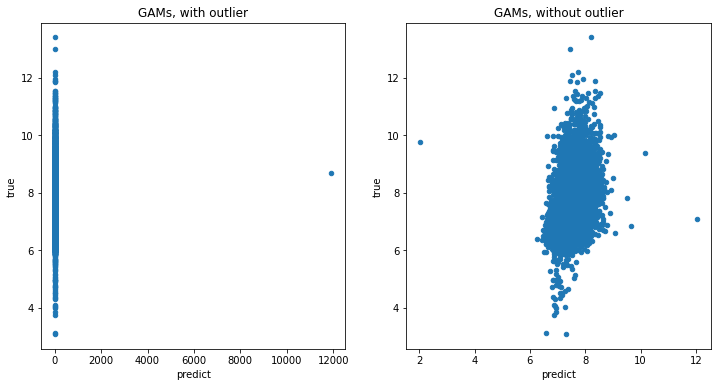

In [29]:
gams_df = pd.DataFrame([gam_reg.predict(x_test), y_test]).T.rename(columns={0:'predict', 1:'true'})
gams_df['abs_diff'] = np.abs(gams_df['predict'] - gams_df['true'])

fig, axs = plt.subplots(1, 2, figsize=(12,6))

gams_df.plot(y='true', x='predict', kind='scatter', ax=axs[0])
gams_df.sort_values('abs_diff', ascending=False).iloc[1:,:].plot(y='true', x='predict', kind='scatter', ax=axs[1])

axs[0].set_title('GAMs, with outlier')
axs[1].set_title('GAMs, without outlier')

Text(0, 0.5, 'True')

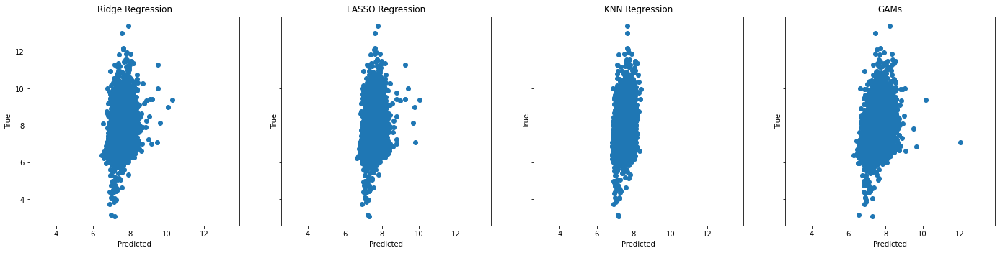

In [46]:
fig, axs = plt.subplots(1, 4, figsize=(24,6), sharey=True)
axs[0].scatter(ridge_reg.predict(x_test), y_test)
axs[0].set_title('Ridge Regression')
axs[0].set_aspect('equal')
axs[0].set_xbound(axs[0].get_ybound())
axs[0].set_xlabel('Predicted')
axs[0].set_ylabel('True')
axs[1].scatter(lasso_reg.predict(x_test), y_test)
axs[1].set_title('LASSO Regression')
axs[1].set_aspect('equal')
axs[1].set_xbound(axs[1].get_ybound())
axs[1].set_xlabel('Predicted')
axs[1].set_ylabel('True')
axs[2].scatter(knn_reg.predict(x_test), y_test)
axs[2].set_title('KNN Regression')
axs[2].set_aspect('equal')
axs[2].set_xbound(axs[2].get_ybound())
axs[2].set_xlabel('Predicted')
axs[2].set_ylabel('True')
axs[3].scatter(gams_df.sort_values('abs_diff', ascending=False).iloc[1:,:]['predict'], gams_df.sort_values('abs_diff', ascending=False).iloc[1:,:]['true'])
axs[3].set_title('GAMs')
axs[3].set_aspect('equal')
axs[3].set_xbound(axs[3].get_ybound())
axs[3].set_xlabel('Predicted')
axs[3].set_ylabel('True')


For the models we have tried so far, the predictions on the test set seems to gather around 6 to 9 while the true values have a much wilder range.

## Boosting, XGBOOST

In [142]:
train_df = pd.read_csv("midterm1_train.csv")
train_df = train_df.drop(['url', 'timedelta'], axis=1)

train_x_all = train_df.drop(['shares'], axis=1)
train_y_all = train_df['shares']

# manually hold out 20% of data for testing
x_train, x_test, y_train, y_test = train_test_split(train_x_all, train_y_all, test_size=0.2, random_state=77)

# transform y_test and y_train due to overly skewed distribution
y_train = np.log(y_train)
y_test = np.log(y_test)

In [134]:
from xgboost import XGBRegressor
from sklearn.model_selection import cross_val_score
# benchmark RF model

xgboost_reg = XGBRegressor(random_state=77, n_jobs=-1)
xgboost_reg.fit(X=x_train, y=y_train)
xgboost_cv_score = cross_val_score(estimator=XGBRegressor(random_state=77, n_jobs=-1), cv=5, scoring="neg_mean_squared_error", X=x_train, y=y_train)

In [135]:
print(f"Benchmark, XGBOOST with stock parameters, \n5-fold cv MSE: {np.mean(-xgboost_cv_score)}, MSE on test set: {get_MSE(xgboost_reg.predict(x_test), y_test)}")

Benchmark, XGBOOST with stock parameters, 
5-fold cv MSE: 0.7664930367162915, MSE on test set: 0.7748923365036171


Text(0.5, 1.0, 'Benchmark XGBOOST Model')

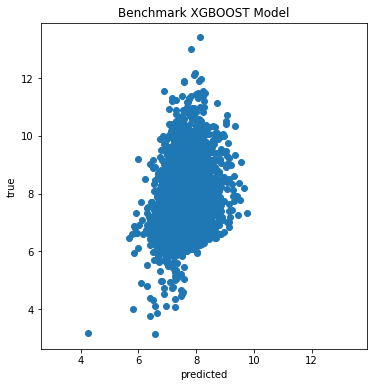

In [136]:
fig, ax = plt.subplots(figsize=(8,6))

ax.scatter(xgboost_reg.predict(x_test), y_test)
ax.set_ybound((ax.get_ylim()))
ax.set_xbound(ax.get_ylim())
ax.set_aspect('equal')
ax.set_xlabel('predicted')
ax.set_ylabel('true')
ax.set_title('Benchmark XGBOOST Model')

Without any tuning, XGBOOST performs better than all the models we have tried so far. It seems like a promising candidate so let's do some hyperparameter tuning.

In [103]:
# Benchmark model, parameters
xgboost_reg.get_params()

{'objective': 'reg:squarederror',
 'base_score': 0.5,
 'booster': 'gbtree',
 'colsample_bylevel': 1,
 'colsample_bynode': 1,
 'colsample_bytree': 1,
 'enable_categorical': False,
 'gamma': 0,
 'gpu_id': -1,
 'importance_type': None,
 'interaction_constraints': '',
 'learning_rate': 0.300000012,
 'max_delta_step': 0,
 'max_depth': 6,
 'min_child_weight': 1,
 'missing': nan,
 'monotone_constraints': '()',
 'n_estimators': 100,
 'n_jobs': -1,
 'num_parallel_tree': 1,
 'predictor': 'auto',
 'random_state': 77,
 'reg_alpha': 0,
 'reg_lambda': 1,
 'scale_pos_weight': 1,
 'subsample': 1,
 'tree_method': 'exact',
 'validate_parameters': 1,
 'verbosity': None}

### Hyperparameter Tuning

We use `optuna` package to conduct and record model trials. Below, we use the `RandomSampler` to randomly sample the parameter space. It acts similarly to `RandomSearch` in `sklearn` but it records the parameters and trial MSE score in a separate database file.

In [ ]:
import optuna
import xgboost as xgb
from sklearn.model_selection import cross_val_score

def objective(trial):
    
    param = {
        'random_state': 77,
        'objective': 'reg:squarederror',
        'tree_method': 'gpu_hist',
        'gpu_id': 0,
        'n_jobs': -1,
        #### tune ####
        'n_estimators': trial.suggest_int("n_estimators", 40, 1200),
        'max_depth': trial.suggest_int("max_depth", 2, 20),
        'learning_rate': trial.suggest_float("learning_rate", 1e-5, 1.0, log=True), #sample on log domain
        'gamma': trial.suggest_float("gamma", 0.0, 10.0), #min split loss, larger -> more conserva.
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 100),
        'subsample': trial.suggest_float('subsample', 0.3, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.2, 1.0),
        'lambda': trial.suggest_float("lambda", 1e-8, 1.0, log=True), # L1 Reg
        'alpha': trial.suggest_float("alpha", 1e-8, 1.0, log=True) # L2 Reg
    }
    print(str(param).replace(',', '\n'))
    xgbr = xgb.XGBRegressor(verbose=10,**param)
    scores = cross_val_score(estimator=xgbr, X=x_train, y=y_train,
                    cv=5, verbose=10, n_jobs=-1, scoring='neg_mean_squared_error')
    return scores.mean()

loaded_study_cont = optuna.load_study(storage="sqlite:///dae1.db",
                                                study_name="xgboost_random",
                                                sampler=optuna.samplers.RandomSampler()
                                                )
loaded_study_cont.optimize(objective, n_trials= 500, timeout=600, show_progress_bar=True)

In [49]:
import optuna
xgboost_random_study = optuna.load_study(storage="sqlite:///dae1.db",
                                                study_name="xgboost_random"
                                                )
df_params = xgboost_random_study.trials_dataframe()
df_params = df_params.query('state == "COMPLETE"')
# subset params_* and value_* columns
df_params = df_params[df_params.columns[df_params.columns.str.startswith('params_')] | df_params.columns[df_params.columns.str.startswith('value')]]
df_params['mse_score'] = -df_params['value']
df_params.drop(['value'], axis=1, inplace=True)
df_params.sort_values('mse_score', ascending=False)

/var/folders/vw/fhlnd7k958g99z5bj0yg57vh0000gn/T/ipykernel_99939/973712034.py:8: FutureWarning: Index.__or__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__or__.  Use index.union(other) instead.
  df_params = df_params[df_params.columns[df_params.columns.str.startswith('params_')] | df_params.columns[df_params.columns.str.startswith('value')]]


,params_alpha,params_colsample_bytree,params_gamma,params_lambda,params_learning_rate,params_max_depth,params_min_child_weight,params_n_estimators,params_subsample,mse_score
230,1.395959e-07,0.706877,4.848538,1.354431e-04,0.000013,12,9,87,0.908111,49.410578
76,5.837379e-05,0.389629,4.811423,2.159880e-02,0.000013,12,3,198,0.819250,49.274056
129,4.781797e-05,0.366262,9.859967,5.092515e-04,0.000040,10,8,64,0.913773,49.272523
508,3.296925e-03,0.278457,9.763153,1.080317e-06,0.000013,2,4,204,0.449009,49.269311
499,1.145378e-07,0.964837,2.269687,3.390160e-06,0.000012,10,77,257,0.350269,49.211215
...,...,...,...,...,...,...,...,...,...,...
556,3.262072e-03,0.893881,0.975813,2.439989e-08,0.007267,14,42,791,0.382291,0.715960
9,1.871705e-07,0.680054,1.453246,8.483249e-02,0.014987,11,95,909,0.913639,0.715797
233,2.500119e-07,0.808243,2.718159,6.139870e-02,0.015192,9,36,509,0.535634,0.715485
316,2.425796e-08,0.494875,1.913825,1.109435e-02,0.014921,11,15,991,0.585822,0.714668


Text(0.5, 1.0, 'Random Trials, XGBOOST')

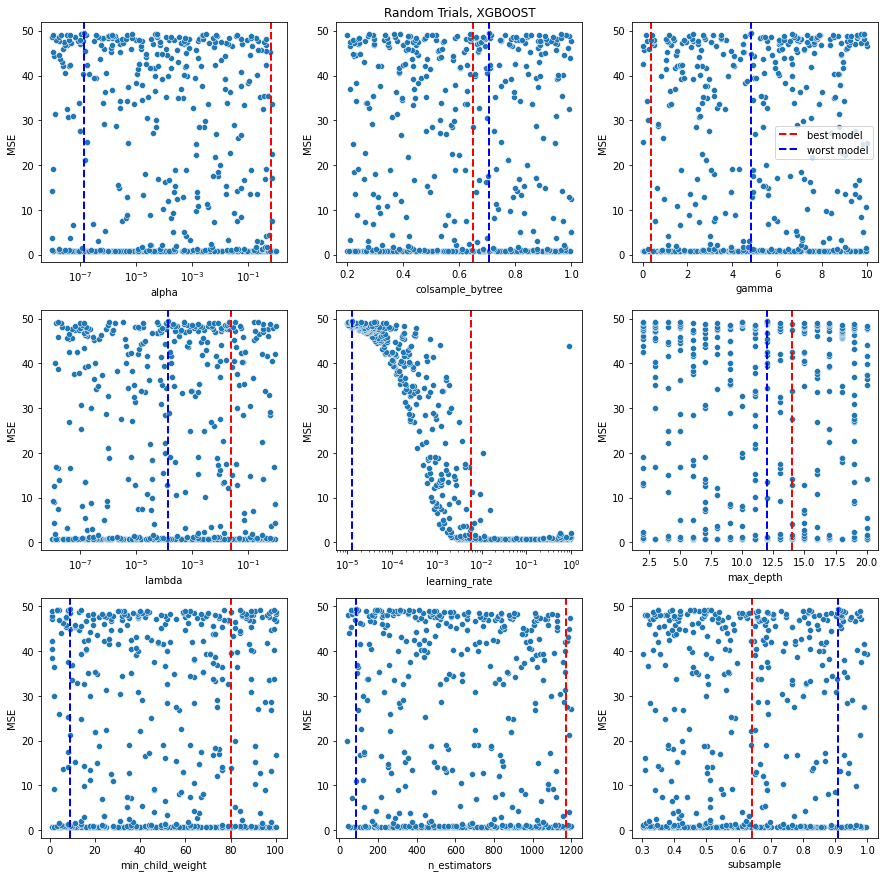

In [50]:
fig, ax = plt.subplots(3, 3, figsize=(15, 15))
for i, param in enumerate(df_params.columns):
    if param == 'mse_score':
        continue
    # best value
    # sort df
    df_params.sort_values(by='mse_score', inplace=True)
    best_value = df_params.iloc[0][param]
    worst_value = df_params.iloc[-1][param]
    # scatter with x-axis log scale
    sns.scatterplot(x=param, y='mse_score', data=df_params, ax=ax[i // 3, i % 3])
    ax[i // 3, i % 3].axvline(best_value, color='r', linestyle='--', linewidth=2, label="best model")
    ax[i // 3, i % 3].axvline(worst_value, color='b', linestyle='--', linewidth=2, label='worst model')
    if param in ['params_alpha', 'params_lambda', 'params_learning_rate']:
        ax[i // 3, i % 3].set_xscale('log')
    #ax[i // 3, i % 3].set_yscale('log')
    ax[i // 3, i % 3].set_xlabel(param[7:])
    ax[i // 3, i % 3].set_ylabel('MSE')
    # legend mid left
ax[0,2].legend(loc='center right')
ax[0,1].set_title("Random Trials, XGBOOST")

Based on the trials with randomly distributed parameters, wee can see that learning rate has the most prominent relationship with the MSE estimate or the model performance.

Because we are more interested in how to improve the model performance, we then focus on the trials with MSE < 1.

Text(0.5, 1.0, 'Random Trials, XGBOOST')

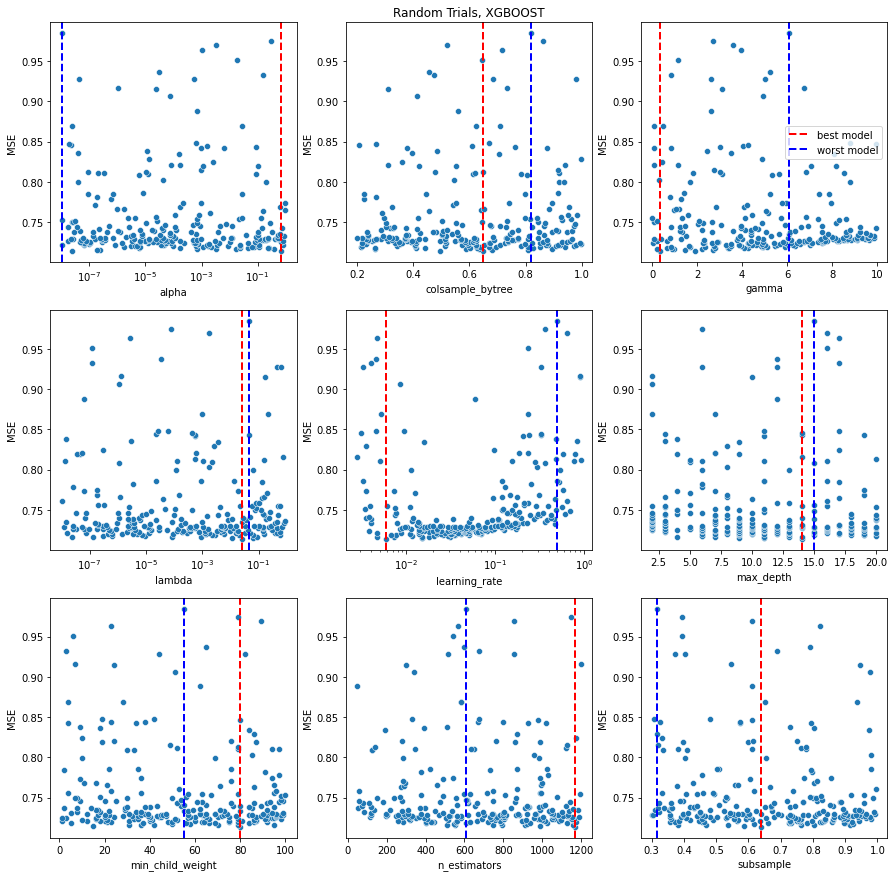

In [51]:
df_params_subset = df_params.query('mse_score <= 1').copy()
fig, ax = plt.subplots(3, 3, figsize=(15, 15))
for i, param in enumerate(df_params.columns):
    if param == 'mse_score':
        continue
    # best value
    # sort df
    df_params_subset.sort_values(by='mse_score', inplace=True)
    best_value = df_params_subset.iloc[0][param]
    worst_value = df_params_subset.iloc[-1][param]
    # scatter with x-axis log scale
    sns.scatterplot(x=param, y='mse_score', data=df_params_subset, ax=ax[i // 3, i % 3])
    ax[i // 3, i % 3].axvline(best_value, color='r', linestyle='--', linewidth=2, label="best model")
    ax[i // 3, i % 3].axvline(worst_value, color='b', linestyle='--', linewidth=2, label='worst model')
    if param in ['params_alpha', 'params_lambda', 'params_learning_rate']:
        ax[i // 3, i % 3].set_xscale('log')
    
    ax[i // 3, i % 3].set_xlabel(param[7:])
    ax[i // 3, i % 3].set_ylabel('MSE')
    # legend mid left
ax[0,2].legend(loc='center right')
ax[0,1].set_title("Random Trials, XGBOOST")

Still, only the learning rate parameter presents a slightly noticeable relationship with MSE – it seems that learning rate greater than ~80e-2 start to yield higher MSE estimate.

In [53]:
df_params_random = df_params.copy()
df_params_opt = optuna.load_study(storage="sqlite:///dae1.db", study_name="xgboost").trials_dataframe()
df_params_opt = df_params_opt.query('state == "COMPLETE"')
df_params_opt = df_params_opt[df_params_opt.columns[df_params_opt.columns.str.startswith('params_')] | df_params_opt.columns[df_params_opt.columns.str.startswith('value')]]
df_params_opt['mse_score'] = -df_params_opt['value']
df_params_opt.drop(['value'], axis=1, inplace=True)

/var/folders/vw/fhlnd7k958g99z5bj0yg57vh0000gn/T/ipykernel_99939/3177958509.py:4: FutureWarning: Index.__or__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__or__.  Use index.union(other) instead.
  df_params_opt = df_params_opt[df_params_opt.columns[df_params_opt.columns.str.startswith('params_')] | df_params_opt.columns[df_params_opt.columns.str.startswith('value')]]


The summary stats for top 20 trials with random search:

In [54]:
df_params_random.sort_values('mse_score', ascending=True).head(20).describe()

,params_alpha,params_colsample_bytree,params_gamma,params_lambda,params_learning_rate,params_max_depth,params_min_child_weight,params_n_estimators,params_subsample,mse_score
count,2.000000e+01,20.000000,20.000000,2.000000e+01,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000
mean,9.303845e-02,0.607258,2.452726,4.273322e-02,0.021066,11.750000,57.000000,752.200000,0.686643,0.717388
std,1.701807e-01,0.206295,1.606524,1.295611e-01,0.012531,4.799945,24.313739,269.831253,0.177030,0.001747
min,2.425796e-08,0.216003,0.205825,2.439989e-08,0.004654,4.000000,5.000000,283.000000,0.356703,0.713565
25%,6.229869e-06,0.481980,0.947693,1.174748e-06,0.010711,7.750000,40.750000,550.250000,0.573275,0.716119
50%,1.023798e-02,0.635067,2.283451,1.108011e-03,0.019309,11.500000,60.500000,767.000000,0.729335,0.717887
75%,8.265716e-02,0.721241,3.566723,2.174328e-02,0.031373,14.250000,72.250000,951.250000,0.807671,0.718667
max,6.618827e-01,0.939109,5.110888,5.826552e-01,0.050252,20.000000,95.000000,1170.000000,0.924138,0.719616


The summary stats for top 20 trials with `optuna`'s default TPESampler:

In [55]:
df_params_opt.sort_values('mse_score', ascending=True).head(20).describe()

,params_alpha,params_colsample_bytree,params_gamma,params_lambda,params_learning_rate,params_max_depth,params_min_child_weight,params_n_estimators,params_subsample,mse_score
count,2.000000e+01,20.000000,20.000000,2.000000e+01,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000
mean,4.736221e-08,0.387456,1.194651,8.330147e-02,0.007630,17.450000,78.550000,1072.000000,0.708671,0.712734
std,4.900045e-08,0.042416,0.303147,2.594914e-01,0.001175,2.394621,12.688474,98.609277,0.071995,0.000212
min,1.047221e-08,0.317893,0.725219,1.014270e-08,0.006201,12.000000,32.000000,824.000000,0.482964,0.712119
25%,2.570996e-08,0.367964,0.961312,2.652777e-08,0.006600,16.000000,76.500000,1035.500000,0.710720,0.712626
50%,3.071974e-08,0.396544,1.036021,5.167080e-08,0.007378,18.500000,80.500000,1103.000000,0.726602,0.712829
75%,4.295324e-08,0.401791,1.379140,1.146297e-07,0.008386,19.250000,85.250000,1136.500000,0.748490,0.712874
max,2.031165e-07,0.493749,1.843185,9.561748e-01,0.010109,20.000000,94.000000,1195.000000,0.763528,0.712939


We can notice that the mean learning rate is ~70e-4, which does not agree with the visualizations we did above. Therefore, we use the parameters based on the top 20 trials by random search.

In [147]:
xgboost_param = df_params_random.sort_values('mse_score', ascending=True).head(20).describe().drop(['mse_score'], axis=1).rename(columns={col: col[7:] for col in df_params_opt.columns}).loc['mean']
xgboost_param = xgboost_param.to_dict()
xgboost_param['n_estimators'] = int(xgboost_param['n_estimators'])
xgboost_param['max_depth'] = int(xgboost_param['max_depth'])
xgboost_param

{'alpha': 0.09303844529603165,
 'colsample_bytree': 0.6072577708558533,
 'gamma': 2.452725566666583,
 'lambda': 0.04273321894929624,
 'learning_rate': 0.021065609722132183,
 'max_depth': 11,
 'min_child_weight': 57.0,
 'n_estimators': 752,
 'subsample': 0.6866433533539794}

In [152]:
# Final Model
xgboost_reg_orig = XGBRegressor(random_state=77, **xgboost_param)
xgboost_reg_orig.fit(x_train, np.exp(y_train))

xgboost_reg_log = XGBRegressor(random_state=77, **xgboost_param)
xgboost_reg_log.fit(x_train, y_train)

print(f"XGBOOST, trained with y on its origina scale, RMSE: {get_MSE(xgboost_reg_orig.predict(x_test), np.exp(y_test)) ** 0.5}")
print(f"XGBOOST, trained with y on log scale, RMSE (orig. scale): {get_MSE(np.exp(xgboost_reg_log.predict(x_test)), np.exp(y_test)) ** 0.5}, MSE (log scale): {get_MSE(xgboost_reg_log.predict(x_test), y_test)}")

XGBOOST, trained with y on its origina scale, RMSE: 12276.791707168926
XGBOOST, trained with y on log scale, RMSE (orig. scale): 12367.57285728681, MSE (log scale): 0.7154416718341199


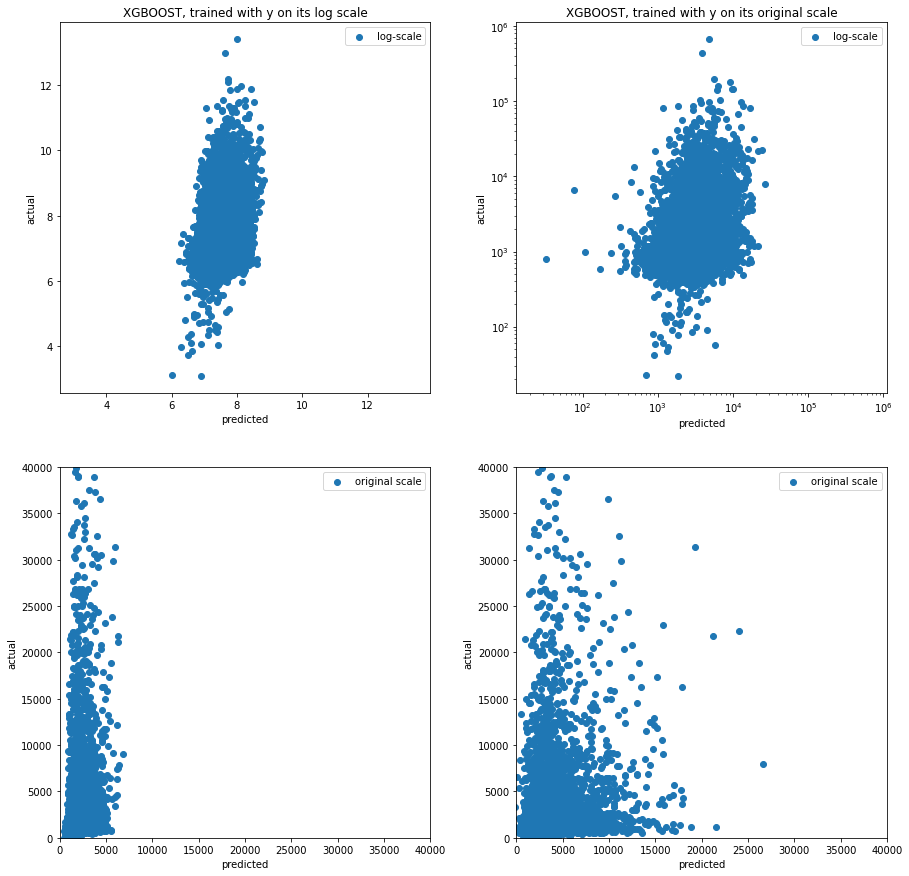

In [160]:
fig, axs = plt.subplots(2, 2, figsize=(15, 15))
axs[0, 0].scatter(xgboost_reg_log.predict(x_test), y_test, label='log-scale')
axs[1, 0].scatter(np.exp(xgboost_reg_log.predict(x_test)), np.exp(y_test), label='original scale')
axs[1, 0].set_ylim(0, 40000) # get rid of the outliers for better visualization
axs[0, 1].scatter(xgboost_reg_orig.predict(x_test), np.exp(y_test), label='log-scale')
axs[0, 1].set_xscale('log')
axs[0, 1].set_yscale('log')
axs[1, 1].scatter(xgboost_reg_orig.predict(x_test), np.exp(y_test), label='original scale')
axs[1, 1].set_ylim(0, 40000) # get rid of the outliers for better visualization
axs[0, 0].set_title('XGBOOST, trained with y on its log scale')
axs[0, 1].set_title('XGBOOST, trained with y on its original scale')
for ax in axs.flatten():
    ax.set_xlabel('predicted')
    ax.set_ylabel('actual')
    ax.legend()
    ax.set_aspect('equal')
    ax.set_xbound(ax.get_ybound())

From the plots above, I think training XGBOOST with the target variable without log-transformation could be a better choice even though its MSE is higher on the test set. Its predictions are more spread-out and more consistent with the true values.

However, let's try random forest next before making our final choice.

## Bagging, Random Forest

### Data Prep

In [185]:
train_df = pd.read_csv("midterm1_train.csv")
train_df = train_df.drop(['url', 'timedelta'], axis=1)

train_x_all = train_df.drop(['shares'], axis=1)
train_y_all = train_df['shares']

# manually hold out 20% of data for testing
x_train, x_test, y_train, y_test = train_test_split(train_x_all, train_y_all, test_size=0.2, random_state=77)

# transform y_test and y_train due to overly skewed distribution
y_train = np.log(y_train)
y_test = np.log(y_test)

In [164]:
# benchmark RF model
from sklearn.ensemble import RandomForestRegressor
rf_reg = RandomForestRegressor(random_state=77, n_jobs=-1)
rf_reg.fit(X=x_train, y=y_train)
rf_reg_cv_score = cross_val_score(RandomForestRegressor(random_state=77, n_jobs=-1), x_train, y_train, cv=5, scoring='neg_mean_squared_error').mean() * -1
print(f"Benchmark, random forest model with stock parameters, MSE (5-fold CV): {rf_reg_cv_score}, \nMSE on test set: {get_MSE(rf_reg.predict(x_test), y_test)}")

Benchmark, random forest model with stock parameters, MSE (5-fold CV): 0.7392047730580648, 
MSE on test set: 0.7398475734325028


Text(0.5, 1.0, 'Benchmark RF Model')

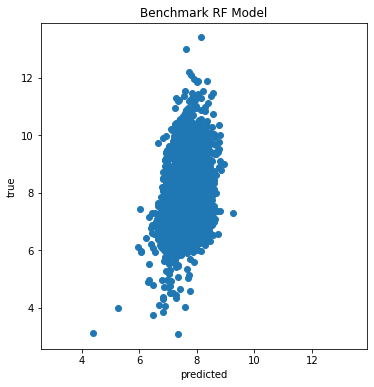

In [8]:
fig, ax = plt.subplots(figsize=(8,6))

ax.scatter(rf_reg.predict(x_test), y_test)
ax.set_ybound((ax.get_ylim()))
ax.set_xbound(ax.get_ylim())
ax.set_aspect('equal')
ax.set_xlabel('predicted')
ax.set_ylabel('true')
ax.set_title('Benchmark RF Model')

Without any hyperparameter tuning, random forest already performs better than the models we have already tried so far (and very close to the tuned boosting model). It seems like a promising choice so let's do some tuning.

### Hyperparameter Tuning for Random Forest

In [ ]:
import optuna
optuna.create_study(storage="sqlite:///dae1.db",
                    study_name="rf_random",
                    direction="maximize" # we maximize the out-of-bag score
                    )

In [ ]:
# Specify parameter field

def rf_objective(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 50, 1200),
        'max_depth': trial.suggest_int('max_depth', 2, 200),
        'min_samples_leaf': trial.suggest_uniform('min_samples_leaf', 1e-4, 0.5),
        'min_samples_split': trial.suggest_uniform('min_samples_split', 1e-4, 0.5),
        'max_features': trial.suggest_uniform('max_features', 0.1, 0.9),
        # non-tunable params, no seed specified b/c it also controls bootstrapping sampling
        'oob_score': True,
        'n_jobs': -1,
        'verbose': 1,
    }
    print(str(params).replace(',', '\n'))
    rf_reg = RandomForestRegressor(**params)
    rf_reg.fit(x_train, y_train)

    return rf_reg.oob_score_

rf_study = optuna.load_study(storage="sqlite:///dae1.db",
                                        study_name="rf_random",
                                        sampler=optuna.samplers.RandomSampler() # equivalent to RandomSearch provided in sklearn, but better database integration
                                        )
rf_study.optimize(rf_objective, n_trials = 1000, timeout=600, show_progress_bar=True)

In [175]:
import optuna
loaded_study = optuna.load_study(storage="sqlite:///dae1.db", study_name='rf_random')
df_params = loaded_study.trials_dataframe()
df_params = df_params.query('state == "COMPLETE"')
# subset params_* and value_* columns
df_params = df_params[df_params.columns[df_params.columns.str.startswith('params_')] | df_params.columns[df_params.columns.str.startswith('value')]]
df_params['oob_score'] = df_params['value']
df_params.drop(['value'], axis=1, inplace=True)


/var/folders/vw/fhlnd7k958g99z5bj0yg57vh0000gn/T/ipykernel_99939/1702344255.py:6: FutureWarning: Index.__or__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__or__.  Use index.union(other) instead.
  df_params = df_params[df_params.columns[df_params.columns.str.startswith('params_')] | df_params.columns[df_params.columns.str.startswith('value')]]


`params_max_features`, `params_min_samples_leaf`, `params_min_samples_split` are currently specified as proportions based on the number of observations. Let's now convert it back to integer forms based on `sklearn` documentation.

1. `ceil(min_samples_leaf * n_samples)`
2. `ceil(min_samples_split * n_samples)`
3. `round(max_features * n_features)`

In [176]:
df_params = df_params.assign(
    params_max_features = np.round(x_train.shape[1] * df_params['params_max_features']),
    params_min_samples_leaf = np.ceil(x_train.shape[0] * df_params['params_min_samples_leaf']),
    params_min_samples_split = np.ceil(x_train.shape[0] * df_params['params_min_samples_split'])
)
df_params

,params_max_depth,params_max_features,params_min_samples_leaf,params_min_samples_split,params_n_estimators,oob_score
0,58,47.0,12210.0,409.0,938,-0.000069
1,45,36.0,13433.0,5854.0,396,-0.000067
2,142,52.0,4736.0,5191.0,119,0.068035
3,94,34.0,1616.0,1568.0,1036,0.097027
4,105,48.0,1244.0,11329.0,753,0.060876
...,...,...,...,...,...,...
1249,122,49.0,10086.0,10088.0,873,-0.000074
1250,171,6.0,5326.0,10315.0,1178,0.044080
1251,148,18.0,5653.0,9689.0,593,0.062004
1252,163,48.0,758.0,11672.0,122,0.059503


Text(0.5, 0.98, 'Random forest OOB Score vs. Hyperparameters')

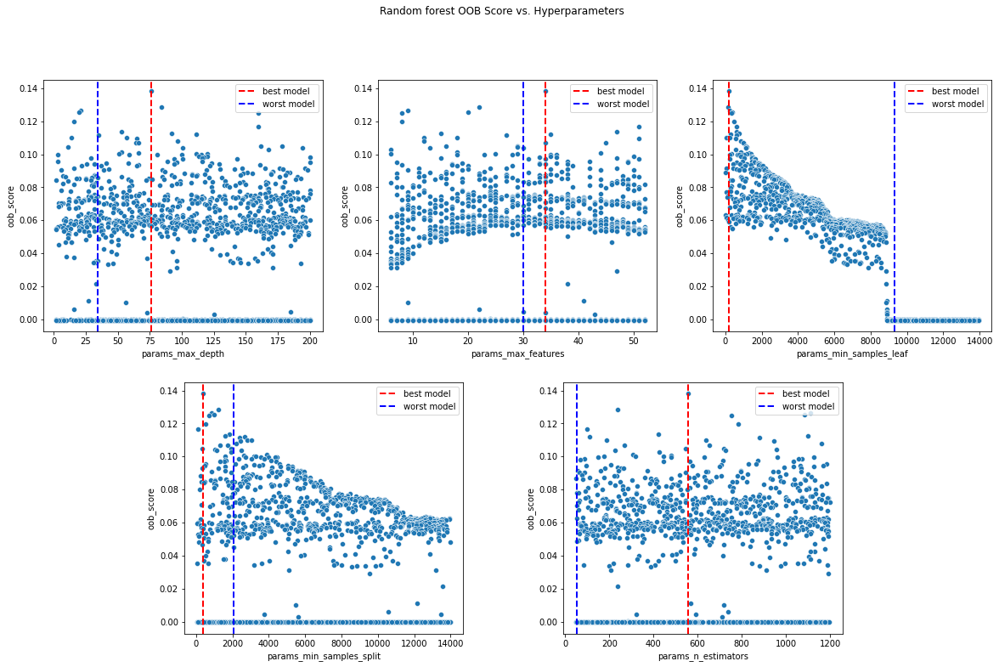

In [177]:
fig, ax = plt.subplots(2, 3, figsize=(20, 12))
for i, param in enumerate(df_params.columns):
    if param == 'oob_score':
        continue
    # best value
    df_params.sort_values(by='oob_score', inplace=True, ascending=False)
    best_value = df_params.iloc[0][param]
    worst_value = df_params.iloc[-1][param]

    sns.scatterplot(x=param, y='oob_score', data=df_params, ax=ax[i // 3, i % 3])
    ax[i // 3, i % 3].axvline(best_value, color='r', linestyle='--', linewidth=2, label="best model")
    ax[i // 3, i % 3].axvline(worst_value, color='b', linestyle='--', linewidth=2, label="worst model")

    ax[i // 3, i % 3].set_xlabel(param)
    ax[i // 3, i % 3].set_ylabel('oob_score')
    ax[i // 3, i % 3].legend()
    # layer density plot
    #sns.kdeplot(x=df_params[param], ax=ax[i // 3, i % 3])

ax[1, 2].set_visible(False)
ax[1][0].set_position([0.24,0.125,0.228,0.343])
ax[1][1].set_position([0.55,0.125,0.228,0.343])
fig.suptitle("Random forest OOB Score vs. Hyperparameters")

We can notice that for `min_samples_leaf > ~9000`, the oob score plummets to ~0. To achieve a cleaner visualization and mitigate its influence on other plots, we filter out the trials with `min_samples_leaf > ~9000`

In [178]:
df_params\
    .query("params_min_samples_leaf > 8900")\
    .sort_values(['params_min_samples_leaf', 'oob_score'], ascending=[True, False])


,params_max_depth,params_max_features,params_min_samples_leaf,params_min_samples_split,params_n_estimators,oob_score
630,101,24.0,8908.0,3706.0,282,0.000464
16,56,32.0,8913.0,3876.0,293,-0.000084
681,44,21.0,8926.0,7599.0,483,-0.000080
363,91,25.0,8936.0,1596.0,265,-0.000071
684,184,6.0,8950.0,12161.0,764,-0.000068
...,...,...,...,...,...,...
1018,143,14.0,13933.0,8683.0,979,-0.000075
1184,145,28.0,13941.0,6855.0,989,-0.000067
17,177,15.0,13943.0,10739.0,478,-0.000080
1068,159,50.0,13955.0,5522.0,505,-0.000067


Index(['params_max_depth', 'params_max_features', 'params_min_samples_leaf',
       'params_min_samples_split', 'params_n_estimators', 'oob_score'],
      dtype='object')


Text(0.5, 0.98, 'Random forest OOB Score vs. Hyperparameters')

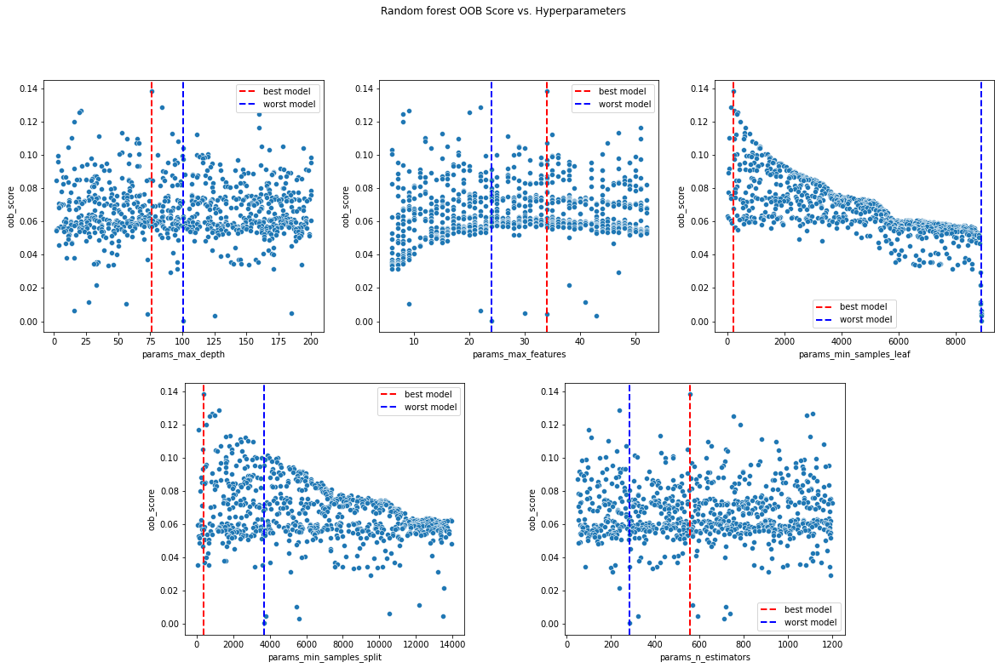

In [179]:
df_params = df_params.query("params_min_samples_leaf <= 8909").copy()
df_params = df_params[[col for col in df_params.columns if col not in ['oob_score']] + ['oob_score']]
print(df_params.columns)
fig, ax = plt.subplots(2, 3, figsize=(20, 12))
for i, param in enumerate(df_params.columns):
    if param == 'oob_score':
        continue
    # best value
    df_params.sort_values(by='oob_score', inplace=True, ascending=False)
    best_value = df_params.iloc[0][param]
    worst_value = df_params.iloc[-1][param]

    sns.scatterplot(x=param, y='oob_score', data=df_params, ax=ax[i // 3, i % 3])
    ax[i // 3, i % 3].axvline(best_value, color='r', linestyle='--', linewidth=2, label="best model")
    ax[i // 3, i % 3].axvline(worst_value, color='b', linestyle='--', linewidth=2, label="worst model")

    ax[i // 3, i % 3].set_xlabel(param)
    ax[i // 3, i % 3].set_ylabel('oob_score')
    ax[i // 3, i % 3].legend()
    # layer density plot
    #sns.kdeplot(x=df_params[param], ax=ax[i // 3, i % 3])

ax[1, 2].set_visible(False)
ax[1][0].set_position([0.24,0.125,0.228,0.343])
ax[1][1].set_position([0.55,0.125,0.228,0.343])
fig.suptitle("Random forest OOB Score vs. Hyperparameters")

Now we can get a better sense on how the parameters influence the model performance. 

1. smaller `min_samples_leaf` leads to higher oob score
2. smaller `min_samples_split` leads to higher oob score

Other parameters do not seem to have a significant impact on the oob score.

To see how the interactions between the parameters influence the model performance, we can use contour plots.

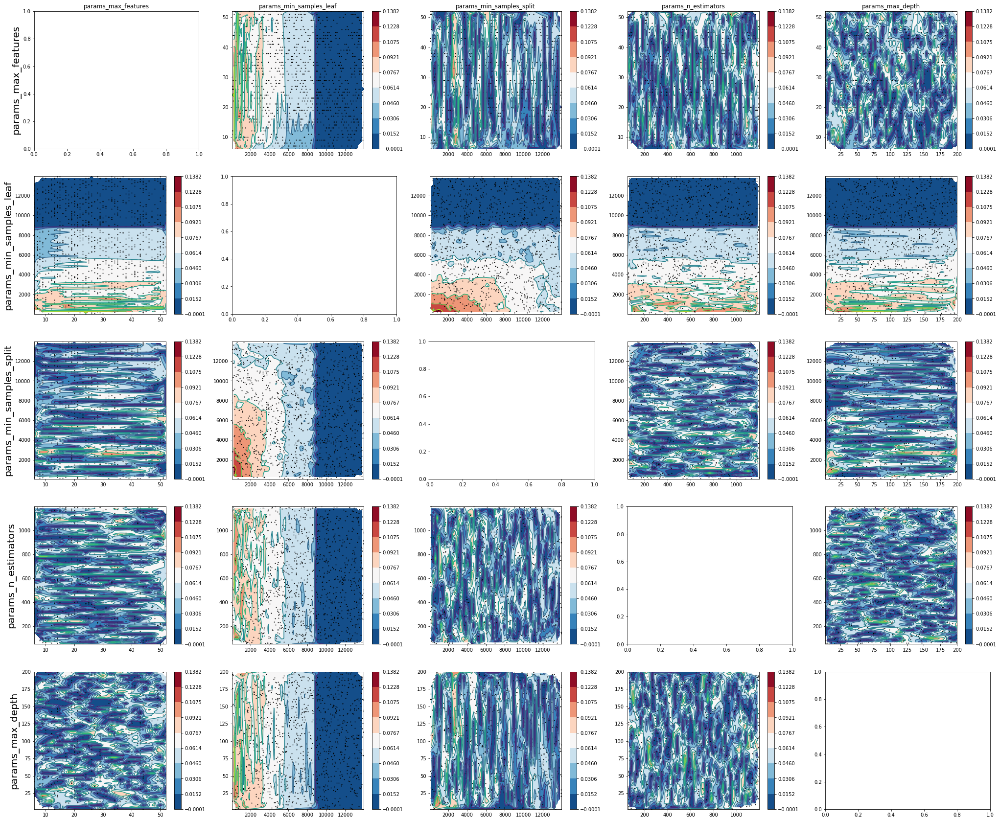

In [85]:
# Contour plot
from scipy.interpolate import griddata
fig, axs = plt.subplots(5, 5, figsize=(35, 30))

df_params = df_params[['params_max_features', 'params_min_samples_leaf', 'params_min_samples_split', 'params_n_estimators', 'params_max_depth', 'oob_score']]

for col, x_param in enumerate(df_params.columns):
    if x_param == 'oob_score': continue
    #df_params = df_params[[i for i in list(df_params.columns) if i not in [x_param, 'oob_score']] + ['oob_score', x_param]]
    #temp_helper = 0
    for row, y_param in enumerate(df_params.columns):
        #print(f"{x_param} vs {y_param}")
        if y_param == 'oob_score': continue
        for item in ([axs[row, col].title, axs[row, col].xaxis.label, axs[row, col].yaxis.label]):
            item.set_fontsize(20)
        if x_param == y_param:
            #axs[row, col].axis('off')
            if row == 0:
                axs[row, col].set_title(x_param)
            if col == 0:
                axs[row, col].set_ylabel(x_param)
            continue
        
        #define grid
        #print(x_param, y_param, row, col)
        xi = np.linspace(df_params[x_param].min(), df_params[x_param].max(), 70)
        yi = np.linspace(df_params[y_param].min(), df_params[y_param].max(), 70)
        xi, yi = np.meshgrid(xi, yi)

        # interpoloate
        zi = griddata((df_params[x_param], df_params[y_param]), df_params['oob_score'], (xi, yi), method='linear')

        # plot
        axs[row, col].contour(xi, yi, zi, levels=np.linspace(np.min(df_params['oob_score']), np.max(df_params['oob_score']), 10))
        contour_i = axs[row, col].contourf(xi, yi, zi, levels=np.linspace(np.min(df_params['oob_score']), np.max(df_params['oob_score']), 10), cmap='RdBu_r')
        fig.colorbar(contour_i, ax=axs[row, col])
        axs[row, col].scatter(df_params[x_param], df_params[y_param], c='k', s=1)
        #axs[row, col].set_xlabel(x_param)
        if col == 0:
            axs[row, col].set_ylabel(y_param)
        if row == 0:
            axs[row, col].set_title(x_param)
        #axs[row, col].set_title(f"{x_param[7:]} vs. {y_param[7:]}")

However, except for the `min_sample_leaf` parameter, the contour plots are not very informative. There are too many local regions with low `oob_score` and therefore not very helpful for making decisions on the best hyperparameters. Still, even `min_sample_leaf` does not give us any additional information because it seems to only 'interact' with the `min_sample_split` parameter – both smaller `min_sample_leaf` and smaller `min_sample_split` lead to higher `oob_score`.

Let's use Optuna's built-in interactive visualization tools to see if we can find a better way to visualize the relationship between the parameters.

In [333]:
import plotly.io as pio
import plotly.graph_objects as go

pio.renderers.default = "notebook"
rf_random_study = optuna.load_study(study_name='rf_random', storage='sqlite:///dae1.db')
fig = optuna.visualization.plot_parallel_coordinate(rf_random_study)
fig.show()

![figure1](rf_param_interactive.gif) 

Similarly, this plot confirms that `min_samples_leaf` together with `min_samples_split` associate with higher out-of-bag score, but it still does not provide any additional information on how to tune other hyperparameters.

Therefore, let's try dependent sampling of hyperparameters on their feasible range, using Optuna's default `TPESampler` sampler.

In [ ]:
#non-random sampler

def rf_objective(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 50, 1200),
        'max_depth': trial.suggest_int('max_depth', 2, 200),
        'min_samples_leaf': trial.suggest_uniform('min_samples_leaf', 1e-4, 0.5), #uniform prior
        'min_samples_split': trial.suggest_uniform('min_samples_split', 1e-4, 0.5),
        'max_features': trial.suggest_uniform('max_features', 0.1, 0.9),
        # non-tunable params, no seed specified b/c it also controls bootstrapping sampling
        'oob_score': True,
        'n_jobs': -1,
        'verbose': 1,
    }
    print(str(params).replace(',', '\n'))
    rf_reg = RandomForestRegressor(**params)
    rf_reg.fit(x_train, y_train)

    return rf_reg.oob_score_

rf_study = optuna.load_study(storage="sqlite:///dae1.db",
                                        study_name="rf",
                                        sampler=optuna.samplers.TPESampler() #TPESampler()
                                        )
rf_study.optimize(rf_objective, n_trials = 1000, timeout=600, show_progress_bar=True)

In [334]:
rf_study = optuna.load_study(storage="sqlite:///dae1.db", study_name="rf")
fig = optuna.visualization.plot_parallel_coordinate(rf_study)
fig.show()

With more new trials, we can now find reasonable ranges for `max_depth` and `max_features`, within which the `obb_score` is maximized.

![figure2](rf_param_tpeSampler.png)

### Final Full Model

In [191]:
df_params_opt = rf_study.trials_dataframe()
df_params_opt = df_params_opt.query('state == "COMPLETE"')
# subset params_* and value_* columns
df_params_opt = df_params_opt[df_params_opt.columns[df_params_opt.columns.str.startswith('params_')] | df_params_opt.columns[df_params_opt.columns.str.startswith('value')]]
df_params_opt['oob_score'] = df_params_opt['value']
df_params_opt.drop(['value'], axis=1, inplace=True)
df_params_opt.sort_values(by='oob_score', ascending=False).head(50).describe() # top 50 trials, max_depth and max_features are in the range specified above

/var/folders/vw/fhlnd7k958g99z5bj0yg57vh0000gn/T/ipykernel_99939/2547907370.py:4: FutureWarning:

Index.__or__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__or__.  Use index.union(other) instead.



,params_max_depth,params_max_features,params_min_samples_leaf,params_min_samples_split,params_n_estimators,oob_score
count,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000
mean,143.000000,0.343383,0.000190,0.000235,1082.840000,0.166618
std,12.136973,0.056633,0.000050,0.000084,69.470111,0.000326
min,119.000000,0.180030,0.000101,0.000112,884.000000,0.166141
25%,135.250000,0.316059,0.000151,0.000164,1027.250000,0.166327
50%,141.000000,0.337970,0.000189,0.000224,1104.500000,0.166577
75%,151.000000,0.364903,0.000232,0.000296,1130.250000,0.166854
max,166.000000,0.534908,0.000316,0.000410,1200.000000,0.167287


In [197]:
rf_params_opt = df_params_opt.sort_values(by='oob_score', ascending=False).head(50).describe().drop(['oob_score'], axis=1).rename(columns={col: col[7:] for col in df_params_opt.columns}).loc['mean']
rf_params_opt = rf_params_opt.to_dict()
rf_params_opt['n_estimators'] = int(rf_params_opt['n_estimators'])
rf_params_opt['max_depth'] = int(rf_params_opt['max_depth'])
rf_params_opt

{'max_depth': 143,
 'max_features': 0.3433828234703068,
 'min_samples_leaf': 0.00018962233537909192,
 'min_samples_split': 0.00023545790154752035,
 'n_estimators': 1082}

#### Fit with target variable on its original scale

In [204]:
train_df = pd.read_csv("midterm1_train.csv")
train_df = train_df.drop(['url', 'timedelta'], axis=1)

train_x_all = train_df.drop(['shares'], axis=1)
train_y_all = train_df['shares']

# manually hold out 20% of data for testing
x_train, x_test, y_train, y_test = train_test_split(train_x_all, train_y_all, test_size=0.2, random_state=77)

rf_reg_orig = RandomForestRegressor(n_jobs=-1, **rf_params_opt)
rf_reg_orig.fit(x_train, y_train)

print(f"Random Forest, trained on target variable's original scale, RMSE: {get_MSE(rf_reg_orig.predict(x_test), y_test) ** 0.5}")

Random Forest, trained on target variable's original scale, RMSE: 12285.365596303502


#### Fit with target variable on log scale

In [216]:
train_df = pd.read_csv("midterm1_train.csv")
train_df = train_df.drop(['url', 'timedelta'], axis=1)

train_x_all = train_df.drop(['shares'], axis=1)
train_y_all = train_df['shares']

# manually hold out 20% of data for testing
x_train, x_test, y_train, y_test = train_test_split(train_x_all, train_y_all, test_size=0.2, random_state=77)

# log transform target variable
y_train_log = np.log(y_train)
y_test_log = np.log(y_test)

rf_reg_log = RandomForestRegressor(n_jobs=-1, **rf_params_opt)
rf_reg_log.fit(x_train, y_train_log)

print(f"Random Forest, trained on target variable's log scale, RMSE (orig. scale): {get_MSE(np.exp(rf_reg_log.predict(x_test)), y_test) ** 0.5}, \nMSE (log scale): {get_MSE(rf_reg_log.predict(x_test), y_test_log)}")

Random Forest, trained on target variable's log scale, RMSE (orig. scale): 12379.397885890594, 
MSE (log scale): 0.7273953565016662


#### Visualize the model performance

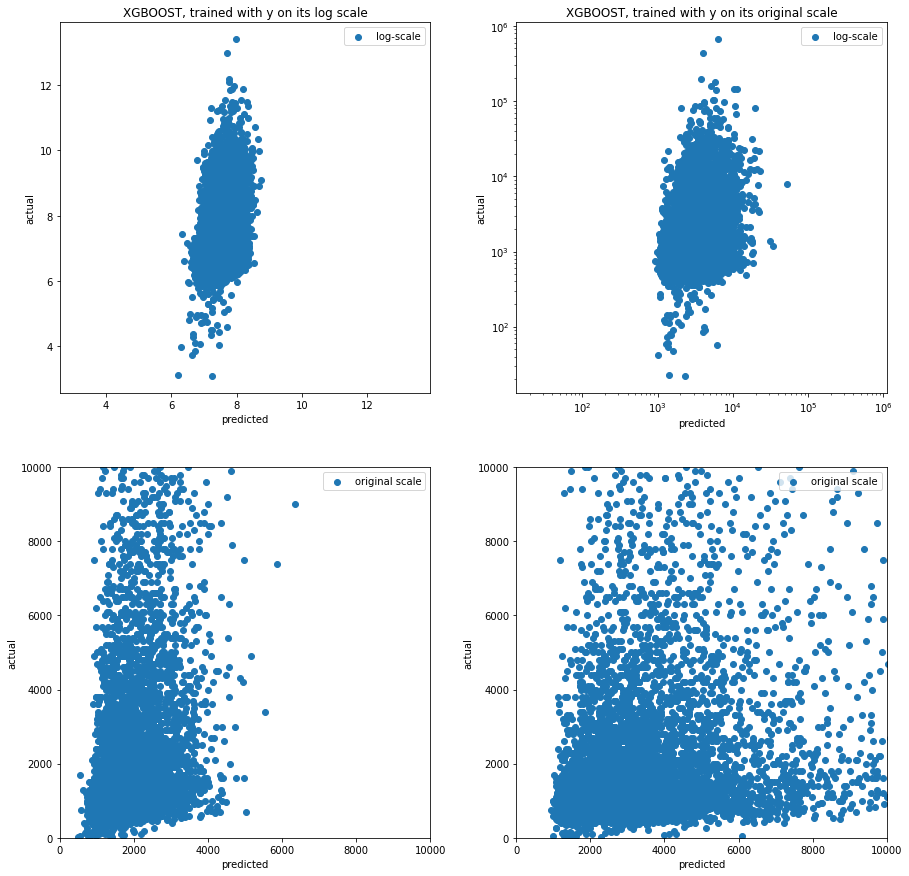

In [221]:
fig, axs = plt.subplots(2, 2, figsize=(15, 15))
axs[0, 0].scatter(rf_reg_log.predict(x_test), y_test_log, label='log-scale')
axs[1, 0].scatter(np.exp(rf_reg_log.predict(x_test)), y_test, label='original scale')
axs[1, 0].set_ylim(0, 10000) # get rid of the outliers for better visualization
axs[0, 1].scatter(rf_reg_orig.predict(x_test), y_test, label='log-scale')
axs[0, 1].set_xscale('log')
axs[0, 1].set_yscale('log')
axs[1, 1].scatter(rf_reg_orig.predict(x_test), y_test, label='original scale')
axs[1, 1].set_ylim(0, 10000) # get rid of the outliers for better visualization
axs[0, 0].set_title('XGBOOST, trained with y on its log scale')
axs[0, 1].set_title('XGBOOST, trained with y on its original scale')
for ax in axs.flatten():
    ax.set_xlabel('predicted')
    ax.set_ylabel('actual')
    ax.legend()
    ax.set_aspect('equal')
    ax.set_xbound(ax.get_ybound())

Therefore, with the tuned hyperparameters, random forest performs better (lower MSE with either cross validation and the held-out set) than KNN and the linear models we have tried so far.

It has similar performance to XGBOOST, but random forest is more interpretable compared to boosting trees, so we choose random forest (non-log-transformed) as our final model.

## Strengths and Weaknesses of Random Forest

Different from the linear models we have tried (Ridge, LASSO, GAMs), all of which perform well under specific conditions but poorly when the assumptions underlying them are violated, nonparametric models such as random forest are more robust to the potential nonlinearities in the data. While GAMs are flexible and, similar to random forest, can capture nonlinear relationships between covariates, they can become much more difficult to handle when the covariate space is large (58 variables in our case) due to the fact that there are "infinitely" many ways to model each spline or tensor terms. GAM's model performance is therefore largely dependent on its user's ability to model the complex interactions among covariates in the first place. Random forest, on the other hand, is much more forgiving to complex interactions and can handle a large number of covariates as it takes the advantage of bootstrapping or bagging many decision trees. Furthermore, even though random forests do have some hyperparameters that need to be tuned (unlike K-nearest neighbors), they are still easier to tune and less computationally intensive to fit than Boosting algorithms. Based on the model performance retrieved from cross validation and our test set, Random Forest achieved a similar MSE as XGBOOST, and performed better than KNN and all of the linear models we have tried.

One potential downside of random forest is that its predictions are less interpretable than those from linear models such as the shrinkage methods and GAMs. Unlike GAMs that can be decomposed into a simple sum of terms, each of which corresponds to a specific nonlinear relationship between the covariates and the response, random forest's predictions are a bag of trees where the individual trees that split on different subsets of variables and data. This makes it difficult to ascertain why a particular observation was predicted a certain way while with linear models, one can always look at the corresponding coefficient or plot the marginal effects of the covariates.

# Interpreting the Big Predictive Model

Since we chose Random Forest as our final model, it is not as easy to interpret the marginal effects of the covariates as it is with linear models. However, we can still gain insights into how the predictors influence the response by calculating the permutation importance of the covariates. "The permutation feature importance is defined to be the decrease in a model score when a single feature value is randomly shuffled", as described [here](https://scikit-learn.org/stable/modules/permutation_importance.html#permutation-importance).

In [238]:
# Code below is taken from the resources stated above
from sklearn.inspection import permutation_importance
r = permutation_importance(rf_reg_orig, x_test, y_test,
                           n_repeats=30,
                           random_state=77, scoring='neg_mean_squared_error')


<AxesSubplot:>

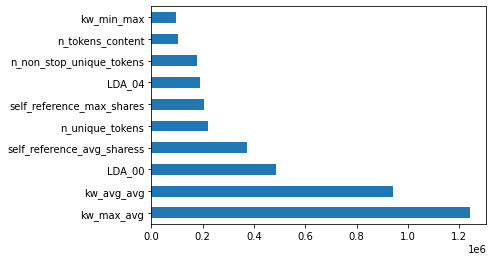

In [241]:
forest_importance = pd.Series(r.importances_mean, index=x_train.columns)
forest_importance.nlargest(10).plot(kind='barh')

In [239]:
# Code below is taken from the resources stated above
for i in r.importances_mean.argsort()[::-1]:
    if r.importances_mean[i] - 2 * r.importances_std[i] > 0:
        print(f"{x_train.columns[i]:<8} " 
              f"{r.importances_mean[i]:.3f}" 
              f" +/- {r.importances_std[i]:.3f}")

kw_max_avg 1243202.128 +/- 206858.442
kw_avg_avg 942916.004 +/- 432518.509
LDA_00   485361.239 +/- 154955.307
n_unique_tokens 220878.128 +/- 70214.729
LDA_04   189176.565 +/- 66507.243
n_non_stop_unique_tokens 177664.559 +/- 74744.884
kw_min_max 95985.710 +/- 43303.192
weekday_is_monday 33861.050 +/- 11776.847
data_channel_is_tech 32137.919 +/- 10312.349


We can that `kw_max_avg` and `kw_avg_avg` arr the most influential features in our model. According to the data description provided:

1. kw_max_avg:                    Avg. keyword (max. shares)
2. kw_avg_avg:                    Avg. keyword (avg. shares)
3. LDA_00:                        Closeness to LDA topic 0
4. n_unique_tokens:               Rate of unique words in the content

Based on this information, we can infer that a new's article's keyword shares are the most important predictors for the news article's popularity. Furthermore, the closeness an article is to topic LDA 0 and its rate of unique words also play a role in predicting the article's popularity. However, we cannot know the direction of the effect these predictors have on the response (e.g., whether a higher keyword share leads to a more popular article or not) – although intuitively, it does seem that a higher keyword share would lead to a more popular article. This is because, under Random Forest, the relationship between covariates and the target variable is not necessarily linear and so the effect that a covariate has on the response can vary depending on its value. And this effect can be very opaque compared to linear models because we have to inspect a large number of trees to get a sense of how the covariates are influencing the response – especially when we have more than 50 variables and the trees are very deep.

# Building a Predictive Model with a Subset of Predictors

Now that we have determined that Random Forest is the best model for predicting news article popularity, we want to build a model using a subset of the predictors. To find the most important variables to put into our models, we use LASSO as feature selection and combine its result with the permutation feature importance from our Random Forest model.



## Regularization Path

In [246]:
lasso_reg_lambdas, lasso_reg_coefs, _ = linear_model.lasso_path(X=x_train, y=y_train, alphas=lasso_reg_cv.alphas_)

num_hrefs
data_channel_is_entertainment
data_channel_is_socmed
kw_avg_avg
is_weekend
LDA_02


Text(0, 0.5, 'beta')

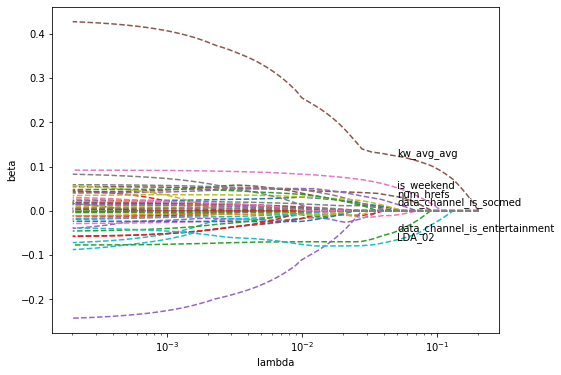

In [248]:
lasso_betas = lasso_reg_coefs
lasso_lambdas = lasso_reg_lambdas

lasso_lambdaBeta_df = pd.DataFrame(columns=['lambda', 'beta'])
for i in range(lasso_betas.shape[1]):
  lasso_lambdaBeta_df = pd.concat([lasso_lambdaBeta_df, pd.DataFrame(
      {'lambda': lasso_lambdas[i],
       'beta': [{"beta"+str(j):lasso_betas.T[i, :][j] for j in range(lasso_betas.shape[0])}]})]
  ).reset_index(drop=True)

lasso_lambdaBeta_df = pd.merge(
    lasso_lambdaBeta_df, 
    pd.json_normalize(lasso_lambdaBeta_df['beta']), 
    left_index=True, right_index=True
    ).drop(['beta'], axis = 1)

lasso_lambdaBeta_df = lasso_lambdaBeta_df.rename(columns={
    "beta"+str(i):train_x_all.columns[i] for i in range(lasso_betas.shape[0])
})

fig, ax = plt.subplots(figsize = (8,6))
for col in train_x_all.columns:
  if col == 'lambda': continue
  x = lasso_lambdaBeta_df['lambda']
  y = lasso_lambdaBeta_df[col]
  ax.plot(x, y, '--', label=col)
  if np.abs(y[200]) < 1e-2: continue
  ax.text(x[200], y[200], col)
  print(col)
ax.set_xlabel('lambda')
ax.set_xscale('log')
ax.set_ylabel('beta')

From the plot above, num_hrefs, data_channel_is_entertainment, data_channel_is_socmed, kw_avg_avg, is_weekend, LDA_02 are the predictors with the largest coefficients under the L1 penalization. kw_avg_avg is the only predictor that is also considered influential by permutation importance, so it will be included in our model. Also, we can see LDA variables are also present in both feature selection/importance processes, so we will keep one of them. We choose LDA_02 because it is the second most important predictor under permutation importance. Similarly, we will include is_weekend because of its presence in both categories. For the last variable, n_unique_tokens and num_hrefs will be chosen. 

This is certainly not a methodical or exhaustive way of selecting predictors that guarantees great model performance, but it provides a starting point for further investigation.

Selected features:

1. kw_avg_avg
2. LDA_02
3. is_weekend
4. n_unique_tokens
5. num_hrefs

Now that we have selected our predictors, we can build our subset model. We will use KNN this time for better model interpretability and also for its simplicity. The reason we choose to not use linear models is that our target variable is in log scale, which means that any potential over extrapolation on log's domain would either cause the model to predict unreasonably high or, even worse, lead to nulls when converting the predictions back into its original scale. KNN does not suffer from this problem at all because its predictions can only be drawn from the set of target variables in its training set.

## KNN, Benchmark Model

In [291]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split

train_df = pd.read_csv("midterm1_train.csv")
train_df = train_df.drop(['url', 'timedelta'], axis=1)

# choose the features
train_df = train_df[['kw_avg_avg', 'LDA_02', 'is_weekend', 'n_unique_tokens', 'num_hrefs', 'shares']].copy()

train_x_all = train_df.drop(['shares'], axis=1)
train_y_all = train_df['shares']

# manually hold out 20% of data for testing
x_train, x_test, y_train, y_test = train_test_split(train_x_all, train_y_all, test_size=0.2, random_state=77)

# transform y_test and y_train due to overly skewed distribution
y_train_log = np.log(y_train)
y_test_log = np.log(y_test)

# standardize x_train and x_test bc knn depends on distance metric
scaler = StandardScaler()
x_train = scaler.fit_transform(x_train)
x_train = pd.DataFrame(x_train, columns=train_x_all.columns)
x_test = scaler.transform(x_test)
x_test = pd.DataFrame(x_test, columns=train_x_all.columns)


In [254]:
# Benchmark KNN Model with K=5
knn_reg = KNeighborsRegressor(n_neighbors=5)
knn_reg.fit(x_train, y_train_log)

knn_cv_score = cross_val_score(KNeighborsRegressor(n_neighbors=5), x_train, y_train_log, cv=5, scoring='neg_mean_squared_error')

print(f"KNN CV Score: {-np.mean(knn_cv_score):.6f}, MSE on test set: {np.mean((y_test_log - knn_reg.predict(x_test))**2):.6f}")


KNN CV Score: 0.928066, MSE on test set: 0.924133


Without any tuning on K, we have a MSE ~0.92, which is not bad. Let's see if we can improve it by tuning K.

## KNN, which K?

In [ ]:
# coarse search for k
k_candidate = range(1, 7001, 200)
knn_cv_result_coarse = dict()

for k in k_candidate:
    knn_reg = KNeighborsRegressor(n_neighbors=k, n_jobs=-1)
    score = cross_val_score(knn_reg, x_train, y_train_log, cv=5, scoring='neg_mean_squared_error', verbose=1, n_jobs=-1)
    knn_cv_result_coarse[k] = -np.mean(score)


In [270]:
knn_cv_result_coarse = pd.DataFrame(knn_cv_result_coarse.items(), columns=['k', 'score'])

Text(0.5, 1.0, 'KNN CV Score vs. k')

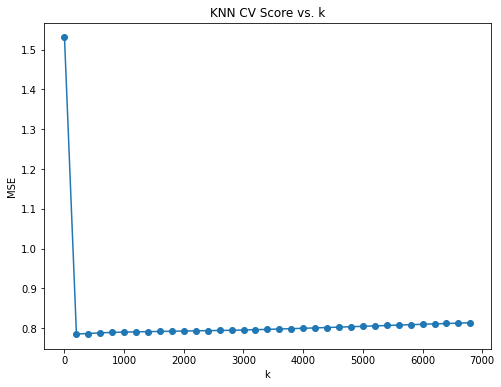

In [273]:
fig, ax = plt.subplots(figsize=(8, 6))
ax.plot(knn_cv_result_coarse['k'], knn_cv_result_coarse['score'], '-o')
ax.set_xlabel('k')
ax.set_ylabel('MSE')
ax.set_title('KNN CV Score vs. k')

In [ ]:
# fine search for k
k_candidate = range(2, 500, 5)
knn_cv_result_fine = dict()

for k in k_candidate:
    knn_reg = KNeighborsRegressor(n_neighbors=k, n_jobs=-1)
    score = cross_val_score(knn_reg, x_train, y_train_log, cv=5, scoring='neg_mean_squared_error', verbose=1, n_jobs=-1)
    knn_cv_result_fine[k] = -np.mean(score)

knn_cv_result_fine = pd.DataFrame(knn_cv_result_fine.items(), columns=['k', 'score'])

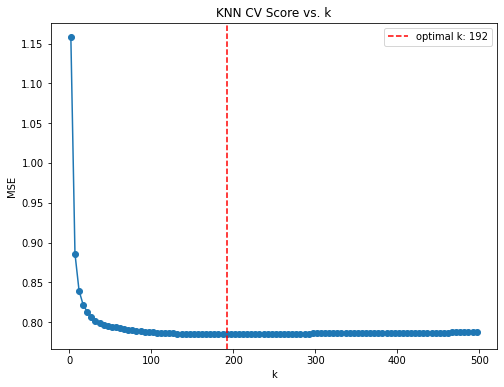

In [282]:
fig, ax = plt.subplots(figsize=(8, 6))
knn_opt_k = knn_cv_result_fine['k'][knn_cv_result_fine['score'].idxmin()]
ax.plot(knn_cv_result_fine['k'], knn_cv_result_fine['score'], '-o')
ax.axvline(x=knn_opt_k, color='r', linestyle='--', label=f"optimal k: {knn_opt_k}")
ax.set_xlabel('k')
ax.set_ylabel('MSE')
ax.set_title('KNN CV Score vs. k')
ax.legend()

In [283]:
# test on the holdout set
knn_reg = KNeighborsRegressor(n_neighbors=knn_opt_k, n_jobs=-1)
knn_reg.fit(x_train, y_train_log)

print(f"KNN CV Score: {knn_cv_result_fine['score'][knn_cv_result_fine['score'].idxmin()]:.6f}, MSE on test set: {np.mean((y_test_log - knn_reg.predict(x_test))**2):.6f}")

KNN CV Score: 0.785190, MSE on test set: 0.789187


After some quick tuning, the optima KNN model is found with k=192 neighbors. With 5-fold cross-validation, the model achieves a MSE of 0.785. On our held-out set, the MSE is 0.789. Surprisingly, its performance is decently close to our full model.

# Interpreting the Subset Model

/Users/fanjiaxz/Library/Mobile Documents/com~apple~CloudDocs/Emory/Spring 2022/Statistical Learning/venv/lib/python3.10/site-packages/sklearn/base.py:443: UserWarning:

X has feature names, but KNeighborsRegressor was fitted without feature names



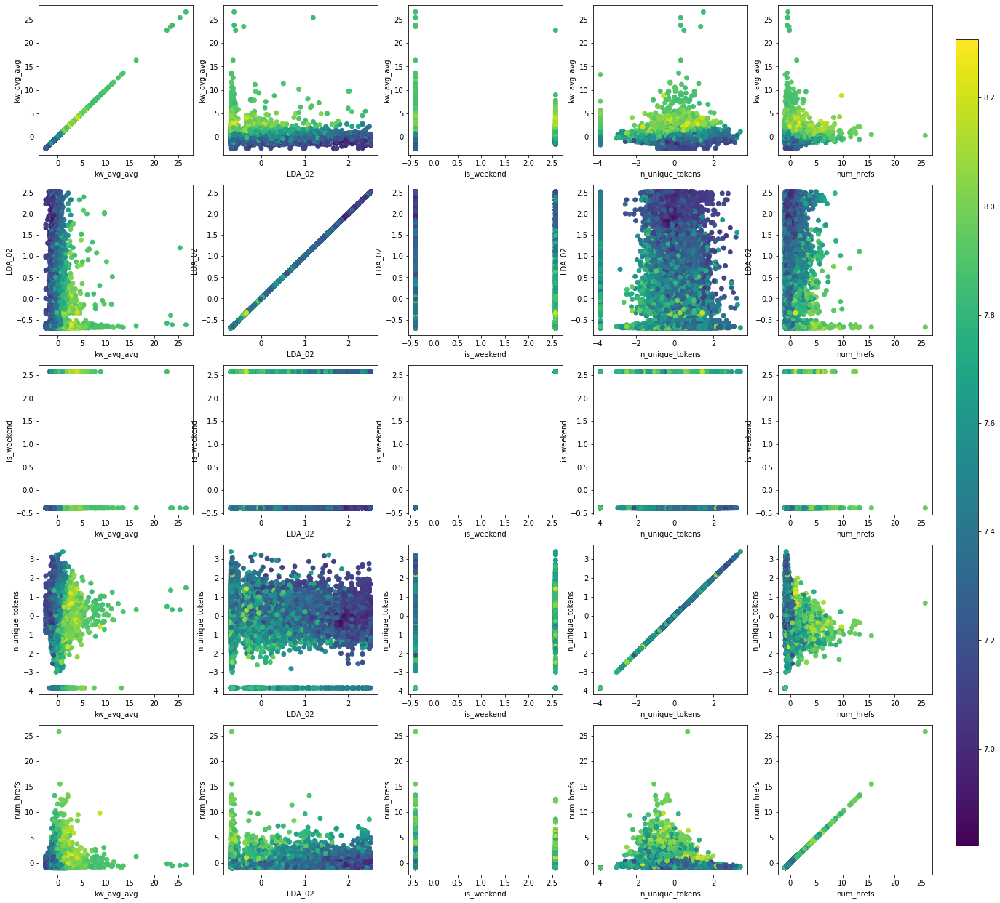

In [306]:
# 5*5 subplots
knn_prediction_train = knn_reg.predict(x_train)
fig, ax = plt.subplots(5, 5, figsize=(22, 22))
for row in range(5):
  for col in range(5):
    x = x_train.columns[col]
    y = x_train.columns[row]
    sc = ax[row, col].scatter(x_train[x], x_train[y], c=knn_prediction_train, cmap='viridis')
    ax[row, col].set_xlabel(x)
    ax[row, col].set_ylabel(y)
# add a colorbar
fig.subplots_adjust(right=0.9)
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
fig.colorbar(sc, cax=cbar_ax)



We can see:

1. a positive relationship between the average keyword shares (kww_avg_avg) and the shares of the news article across all variables.
2. Articles published on weekends on LDA_02 topic are less likely to be popular than those published on weekdays, yet overall, news articles published on weekends are more popular.
3. For news articles on LDA_02 topic, less unique words in the content would make the article more popular
4. In general, more hrefs in the content would make the article more popular

Therefore, the KNN model for predicting news article popularity with a subset of predictors was able to capture the important relationships among the predictors and the target variable. However, we cannot get the marginal effects of these predictors with KNN, and the colored scatterplots only give us the interaction between two covariates, meaning that there could be much more complicated interactions among the predictors that we cannot see from this plot. For example, the weekend effect with LDA_02 topic could be conditional on a third or even fourth predictor in the model. Therefore, the patterns we listed may not be applicable in a real-world setting.

# Building a Predictive Model with a Single Predictor

Now we are trying to predict the number of shares on a news article with only one predictor. It would be better to use a continuous variable to minimize the prediction errors. That being said, linear regression with basis expansion can be a good choice in this case. Based on previous models, we choose `kw_avg_avg` as our predictor.

In [308]:
train_df = pd.read_csv("midterm1_train.csv")
train_df = train_df.drop(['url', 'timedelta'], axis=1)

# choose the features
train_df = train_df[['kw_avg_avg', 'shares']].copy()

train_x_all = train_df.drop(['shares'], axis=1)
train_y_all = train_df['shares']

# manually hold out 20% of data for testing
x_train, x_test, y_train, y_test = train_test_split(train_x_all, train_y_all, test_size=0.2, random_state=77)

# transform y_test and y_train due to overly skewed distribution
y_train_log = np.log(y_train)
y_test_log = np.log(y_test)

In [307]:
from itertools import combinations
def get_basis(degree: int):
    possible_comb = []
    for j in range(1, degree+1):
        for i in list(combinations(list(range(1,degree+1)), j)):
            if degree in i: possible_comb.append(i)
    return possible_comb
get_basis(4)

[(4,), (1, 4), (2, 4), (3, 4), (1, 2, 4), (1, 3, 4), (2, 3, 4), (1, 2, 3, 4)]

In [327]:
import statsmodels.api as sm
def ols_ploy_fit(train_x, train_y, **kwargs):
    nobvs = len(train_x)
    max_param = nobvs - 2
    #if len(train_x.ravel()) > nobvs: raise Exception("err")
    ols_LOOCV = pd.DataFrame(columns=['Degree', 'Basis', 'LOOCV'])
    for degree in range(1, 4):
        for basis in get_basis(degree):
            train_x_ols = pd.DataFrame()
            for paramDegree in basis:
                train_x_ols[f'kw_avg_avg^{paramDegree}'] = train_x ** paramDegree
            train_x_ols.insert(0, 'intercept', np.ones(nobvs))
            
            ols_reg = sm.OLS(endog=train_y, exog=train_x_ols)
            ols_reg_result = ols_reg.fit()
            
            train_y_predict = ols_reg_result.predict(train_x_ols)
            
            hat_diag = ols_reg_result.get_influence().summary_frame()['hat_diag']
            loocv_estimate = 1/nobvs * np.sum(
                ((train_y - train_y_predict)/(np.ones(nobvs) - hat_diag)) ** 2
            )
            ols_LOOCV = pd.concat([ols_LOOCV, pd.DataFrame({'Degree': degree,
             'Basis': str(basis), 'LOOCV': [loocv_estimate]})])
            #print(f"Degree: {basis}, LOOCV: {loocv_estimate}")
    return ols_LOOCV

ols_LOOCV = ols_ploy_fit(x_train, y_train_log)
ols_LOOCV = ols_LOOCV.sort_values('LOOCV', ascending=True)
ols_LOOCV

,Degree,Basis,LOOCV
0,3,"(1, 2, 3)",0.810888
0,2,"(1, 2)",0.813907
0,3,"(1, 3)",0.817079
0,1,"(1,)",0.825873
0,3,"(2, 3)",0.833544
0,2,"(2,)",0.859303
0,3,"(3,)",0.866137


In [329]:
# we choose the basis (1,2,3)

train_x_ols = pd.DataFrame()
for paramDegree in [1,2,3]:
    train_x_ols[f'kw_avg_avg^{paramDegree}'] = x_train ** paramDegree
train_x_ols.insert(0, 'intercept', np.ones(len(x_train)))

ols_reg = sm.OLS(endog=y_train_log, exog=train_x_ols)
ols_reg_result = ols_reg.fit()
ols_reg_result.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 shares   R-squared:                       0.064
Model:                            OLS   Adj. R-squared:                  0.064
Method:                 Least Squares   F-statistic:                     639.9
Date:                Sat, 05 Mar 2022   Prob (F-statistic):               0.00
Time:                        23:52:56   Log-Likelihood:                -36789.
No. Observations:               28000   AIC:                         7.359e+04
Df Residuals:                   27996   BIC:                         7.362e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
intercept        6.5267      0.028    230.871      0.000       6.471       6.582
kw_avg_avg^1     0.0004   1.43e-05     27.391      0.000       0.000       0.000
kw_avg_avg^2 -2.656e-08   1.85e-09    -14.355      0.000   -3.02e-08   -2.29e-08
kw_avg_avg^3  4.535e-13   4.55e-14      9.970      0.000    3.64e-13    5.43e-13
==============================================================================
Omnibus:                     4489.073   Durbin-Watson:                   2.008
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            11067.771
Skew:                           0.905   Prob(JB):                         0.00
Kurtosis:                       5.492   Cond. No.                     3.18e+12
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 3.18e+12. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

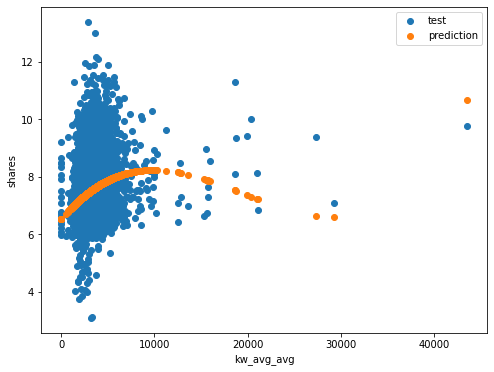

In [331]:
# plot
test_x_ols = pd.DataFrame()
for paramDegree in [1,2,3]:
    test_x_ols[f'kw_avg_avg^{paramDegree}'] = x_test ** paramDegree
test_x_ols.insert(0, 'intercept', np.ones(len(x_test)))


fig, ax = plt.subplots(figsize=(8, 6))
ax.scatter(x_test, y_test_log, label='test')
ax.scatter(x_test, ols_reg_result.predict(test_x_ols), label='prediction')
ax.set_xlabel('kw_avg_avg')
ax.set_ylabel('shares')
ax.legend()

In [332]:
print(f"MSE on test set: {np.mean((y_test_log - ols_reg_result.predict(test_x_ols))**2):.6f}")

MSE on test set: 0.813558
